In [1]:
import pandas as pd   
import numpy as np    
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_formats = ['retina']
import seaborn as sns
import time
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, log_loss
from sklearn.metrics import auc, roc_curve, roc_auc_score, precision_recall_curve
from sklearn.metrics import fbeta_score, cohen_kappa_score
SEED = 42

## Data Set Visualization

In [2]:
df=pd.read_csv('preprocessed_datset.csv')  
df

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.0,174.0,57.500000,39.0,95.5,106.5,20.0,1,0
1,0,8,26.989619,78.0,170.0,57.000000,36.5,90.0,100.0,20.0,1,0
2,0,16,23.939481,75.0,177.0,59.000000,39.0,88.0,104.0,20.0,1,0
3,0,15,22.129740,67.0,174.0,57.000000,35.0,74.0,94.0,20.0,1,0
4,0,15,22.129740,67.0,174.0,57.000000,35.0,74.0,94.0,20.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
5203,1,6,24.005487,63.0,162.0,57.000000,33.0,99.0,101.5,77.0,0,3
5204,0,13,29.964328,63.0,145.0,53.000000,35.8,102.0,112.0,77.0,0,3
5205,0,13,29.964328,63.0,145.0,53.000000,35.8,102.0,112.0,77.0,0,3
5206,0,0,24.654832,60.0,156.0,54.500000,35.0,83.5,99.0,79.0,0,3


In [3]:
print ('Rows     : ', df.shape[0]) # helps to show total no.of rows in dataset
print ('Columns  : ', df.shape[1]) # helps to show total no.of columns(features) in dataset
print ('\nFeatures : \n', df.columns.tolist()) # helps to show the features in dataset
print ('\nMissing values :  ', df.isnull().sum().values.sum()) # help to show total no.of missing values in dataset
print ('\nUnique values :  \n', df.nunique()) # helps to show total no.of unique values in each feature of dataset

Rows     :  5208
Columns  :  12

Features : 
 ['BQ', 'ESS', 'BMI', 'Weight', 'Height', 'Head', 'Neck', 'Waist', 'Buttock', 'Age', 'M', 'status']

Missing values :   0

Unique values :  
 BQ            2
ESS          29
BMI        2076
Weight      434
Height      120
Head        113
Neck        166
Waist       256
Buttock     208
Age          63
M             2
status        4
dtype: int64


In [4]:
df.info() # helps to show datatype of ecah feature in dataset
df.isnull().sum() # helps to show total no.of null values of features in dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5208 entries, 0 to 5207
Data columns (total 12 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   BQ       5208 non-null   int64  
 1   ESS      5208 non-null   int64  
 2   BMI      5208 non-null   float64
 3   Weight   5208 non-null   float64
 4   Height   5208 non-null   float64
 5   Head     5208 non-null   float64
 6   Neck     5208 non-null   float64
 7   Waist    5208 non-null   float64
 8   Buttock  5208 non-null   float64
 9   Age      5208 non-null   float64
 10  M        5208 non-null   int64  
 11  status   5208 non-null   int64  
dtypes: float64(8), int64(4)
memory usage: 488.4 KB


BQ         0
ESS        0
BMI        0
Weight     0
Height     0
Head       0
Neck       0
Waist      0
Buttock    0
Age        0
M          0
status     0
dtype: int64

In [5]:
df = df.dropna() # hepls in droppind the null values in datset
df.info()
print ('\nMissing values :  ', df.isnull().sum().values.sum())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5208 entries, 0 to 5207
Data columns (total 12 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   BQ       5208 non-null   int64  
 1   ESS      5208 non-null   int64  
 2   BMI      5208 non-null   float64
 3   Weight   5208 non-null   float64
 4   Height   5208 non-null   float64
 5   Head     5208 non-null   float64
 6   Neck     5208 non-null   float64
 7   Waist    5208 non-null   float64
 8   Buttock  5208 non-null   float64
 9   Age      5208 non-null   float64
 10  M        5208 non-null   int64  
 11  status   5208 non-null   int64  
dtypes: float64(8), int64(4)
memory usage: 528.9 KB

Missing values :   0


In [6]:
df.describe() # gives statstical data of the dataset

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
count,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000,5208.000000
mean,0.228879,9.783794,26.585641,75.417800,168.040995,56.473109,37.681834,91.126517,100.827016,45.373771,0.762673,1.329685
std,0.420151,5.794717,5.255564,17.170054,8.154482,2.083129,4.154456,13.571392,9.546028,13.099994,0.425485,1.486572
min,0.000000,0.000000,14.765497,37.000000,140.000000,47.000000,26.000000,56.000000,70.000000,20.000000,0.000000,0.000000
25%,0.000000,6.000000,23.120624,64.000000,163.000000,55.000000,35.000000,83.000000,95.000000,35.000000,1.000000,0.000000
50%,0.000000,10.000000,25.795918,74.000000,169.000000,56.500000,37.500000,90.000000,99.500000,44.500000,1.000000,0.000000
75%,0.000000,14.000000,29.000595,85.000000,174.000000,58.000000,40.000000,98.500000,105.000000,55.000000,1.000000,3.000000
max,1.000000,48.000000,59.637308,161.300000,198.000000,66.000000,57.000000,156.000000,149.500000,80.000000,1.000000,3.000000


0    2884
3    2294
1      17
2      13
Name: status, dtype: int64


<function matplotlib.pyplot.show(close=None, block=None)>

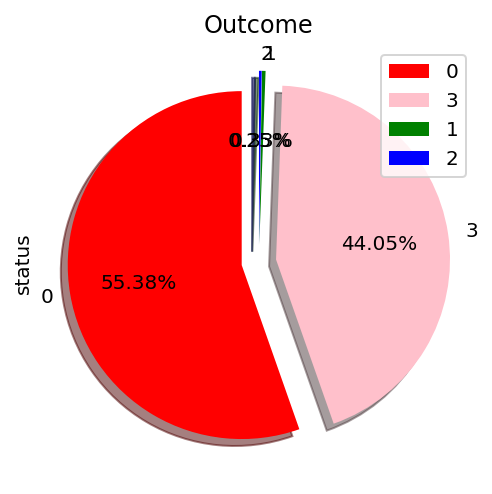

In [7]:
print(df.status.value_counts())
color=['r',"pink","green","blue"]
df['status'].value_counts().plot.pie(colors=color,startangle=90, shadow=True,explode=(0.1, 0.1, 0.1, 0.1), autopct='%1.2f%%').set_title('Outcome')
plt.legend()
plt.show

In [8]:
a=(df.status.value_counts()[0] / df.status.count())*100
a=a.round(3)
print(a)
b=(df.status.value_counts()[1] / df.status.count())*100
b=b.round(3)
print(b)
c=(df.status.value_counts()[2] / df.status.count())*100
c=c.round(3)
print(c)
d=(df.status.value_counts()[3] / df.status.count())*100
d=d.round(3)
print(d)

55.376
0.326
0.25
44.048


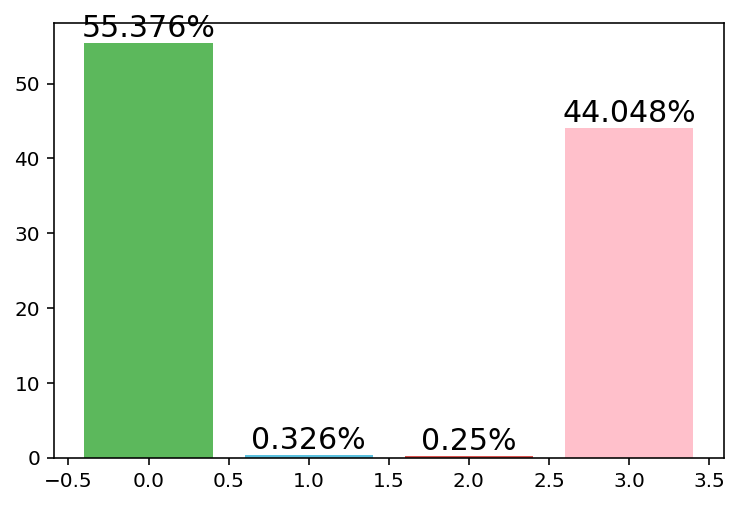

In [9]:
LABELS = ["Normal", "Mild","Moderate","Severe"]
frequencies = (a,b,c,d)

plt.figure()
colors=['#5cb85c','#5bc0de','#d9534f','pink']
p1 = plt.bar(np.arange(len(frequencies)), frequencies,color=colors)

for rect1 in p1:
    height = rect1.get_height()
    plt.annotate( "{}%".format(height),(rect1.get_x() + rect1.get_width()/2, height+.05),ha="center",va="bottom",fontsize=15)

plt.show()


Text(0, 0.5, 'Frequency')

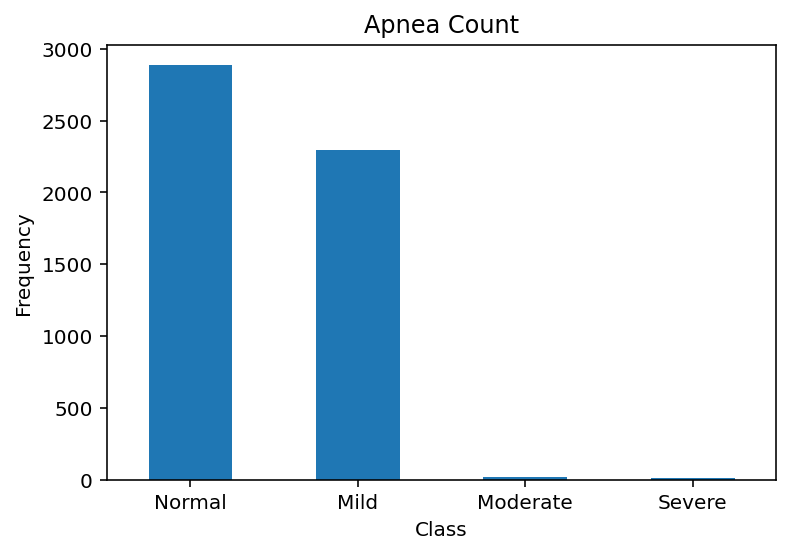

In [10]:
LABELS = ["Normal", "Mild","Moderate","Severe"]

count_classes = pd.value_counts(df['status'], sort = True)

count_classes.plot(kind = 'bar', rot=0)

plt.title("Apnea Count")

plt.xticks(range(4), LABELS)

plt.xlabel("Class")

plt.ylabel("Frequency")

In [11]:
df.head()

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.0,174.0,57.5,39.0,95.5,106.5,20.0,1,0
1,0,8,26.989619,78.0,170.0,57.0,36.5,90.0,100.0,20.0,1,0
2,0,16,23.939481,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0


In [12]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
X = df.iloc[:,0:11]  #independent columns
y = df.iloc[:,-1]    #target column i.e price range
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(12,'Score'))  #print 10 best features

      Specs        Score
3    Weight  4771.473710
7     Waist  3199.638330
2       BMI  1189.204789
8   Buttock   809.847215
1       ESS   732.408253
6      Neck   665.322042
9       Age   390.301311
10        M   137.170498
4    Height    80.044040
5      Head    29.100049
0        BQ    10.907233


[0.01821066 0.07573476 0.13206379 0.103323   0.0723406  0.07001564
 0.12487172 0.1692636  0.08403989 0.09020048 0.05993586]


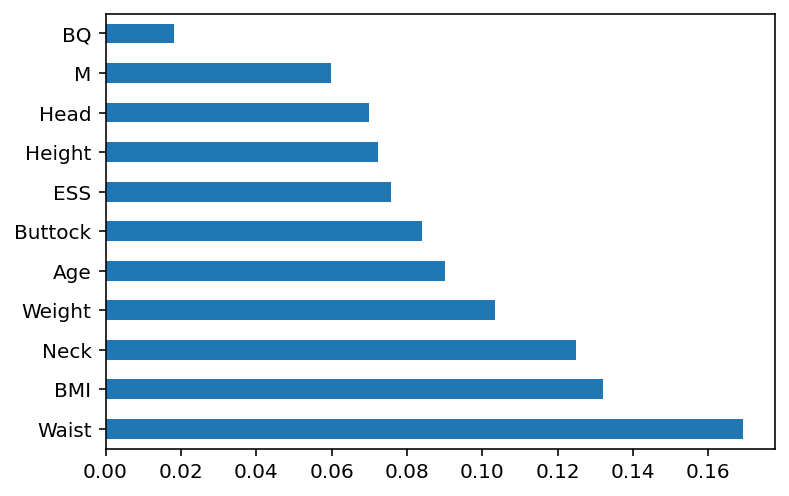

In [13]:
X = df.iloc[:,0:11]  #independent columns
y = df.iloc[:,-1]    #target column i.e price range
#from sklearn.ensemble import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(11).plot(kind='barh')
plt.show()

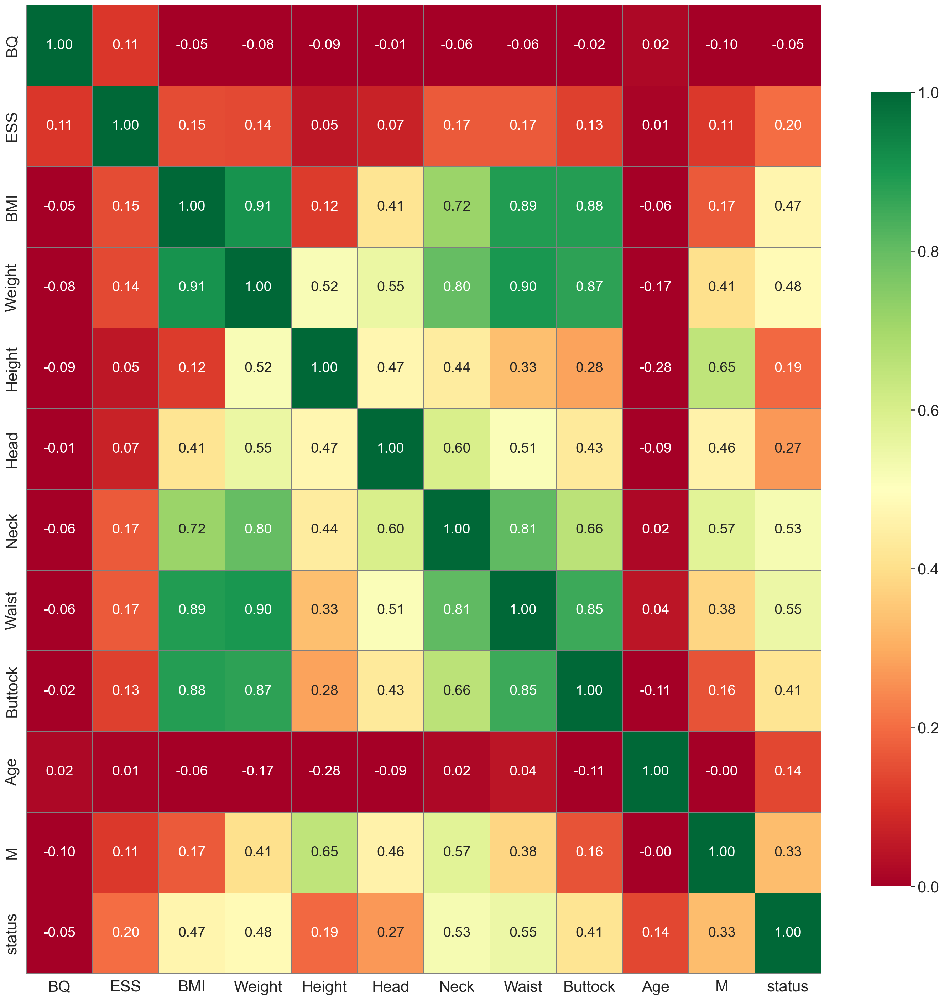

In [14]:
X = df.iloc[:,0:11]  #independent columns
y = df.iloc[:,-1]    #target column i.e price range
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(25,25))
#plot heat map
sns.set(font_scale=2)
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn",vmin=0.0, vmax=1.0, 
                  annot_kws={"size": 20},
                  fmt='.2f', cbar_kws={"shrink": .82},
                  linewidths=0.1, linecolor='gray')

In [15]:
X = df.drop('status', axis=1)   # axis=0 for row, axis=1 for column
y = df['status']

# split data to 80:20 ratio for train/test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)
print('X_test', X_test.shape)
print('y_test', y_test.shape)


X_train (4166, 11)
y_train (4166,)
X_test (1042, 11)
y_test (1042,)


In [16]:
def evaluate(model, X_test , y_test,modelname):
  y_pred1=model.predict(X_test)
  #precision    = precision_score(y_test, y_pred1)
 # recall       = recall_score(y_test, y_pred1)
 # f1score      = f1_score(y_test, y_pred1) 
 # rocauc       = roc_auc_score(y_test, y_pred1)
  #logloss      = log_loss(y_test, y_pred1)
  accuracy     = accuracy_score(y_test, y_pred1)
  classification=classification_report(y_test,y_pred1)
  confusion    = confusion_matrix(y_test, y_pred1)
  df_model1 = pd.DataFrame({  'model'        : [modelname],
                             'accuracy'     : [accuracy],
                            'classification':[classification],
                             #'precision'    : [precision],
                             #'recall'       : [recall],
                             #'f1score'      : [f1score],
                             #'rocauc'       : [rocauc],
                            # 'logloss'      : [logloss],
                             'timetaken'    : [time2],
                            'confusionmatrix' : [confusion]
                            
                                }) 
  return df_model1

In [17]:
%%time
time2=time.time()
print("base model")
base_model = RandomForestClassifier(random_state=0)
base_model.fit(X_train, y_train)
#base_accuracy = evaluate(base_model, X_test, y_test,modelname)
model1 = evaluate(base_model,  X_test,  y_test, 'RandomForest')
model1.timetaken[0] = time.time() - time2
print("Random Forest")
print(base_model.get_params())

model1

base model
Random Forest
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
Wall time: 465 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,RandomForest,0.775432,precision recall f1-score ...,0.464863,"[[467, 0, 0, 97], [3, 1, 0, 0], [1, 0, 1, 0], ..."


In [18]:
%%time
from sklearn.ensemble import ExtraTreesClassifier

time2=time.time()
print("base model")
base_model1 = ExtraTreesClassifier(random_state=0)
base_model1.fit(X_train, y_train)
model2 = evaluate(base_model1,  X_test,  y_test, 'Extra Tree')
model2.timetaken[0] = time.time() - time2
print("Extra Tree")
print(base_model1.get_params())

base model
Extra Tree
{'bootstrap': False, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
Wall time: 353 ms


In [19]:
%%time
time2=time.time()
print("base model")
base_model2 = LogisticRegression(random_state=0)
base_model2.fit(X_train, y_train)
model3 = evaluate(base_model2,  X_test,  y_test, 'Logistic Regression')
model3.timetaken[0] = time.time() - time2
print("Logoistic Regression")
print(base_model2.get_params())

base model
Logoistic Regression
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 0, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Wall time: 127 ms


In [20]:
%%time
time2=time.time()
print("base model")
base_model3 = KNeighborsClassifier()
base_model3.fit(X_train, y_train)
model4 = evaluate(base_model3,  X_test,  y_test, 'KNN')
model4.timetaken[0] = time.time() - time2
print("KNN")
print(base_model3.get_params())
(model4)

base model
KNN
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
Wall time: 55.8 ms


,model,accuracy,classification,timetaken,confusionmatrix
0,KNN,0.74952,precision recall f1-score ...,0.055809,"[[441, 0, 0, 123], [4, 0, 0, 0], [2, 0, 0, 0],..."


In [21]:
%%time
time2=time.time()
print("base model")
base_model4 = LinearSVC(random_state=0)
base_model4.fit(X_train, y_train)
model5 = evaluate(base_model4,  X_test,  y_test, 'LinearSVC')
model5.timetaken[0] = time.time() - time2
print("LinearSVC")
print(base_model4.get_params())

base model
LinearSVC
{'C': 1.0, 'class_weight': None, 'dual': True, 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': 0, 'tol': 0.0001, 'verbose': 0}
Wall time: 482 ms


In [22]:
%%time
time2=time.time()
print("base model")
base_model5 = GaussianNB()
base_model5.fit(X_train, y_train)
model6 = evaluate(base_model5,  X_test,  y_test, 'GaussianNB')
model6.timetaken[0] = time.time() - time2
print("GaussianNB")
print(base_model5.get_params())

base model
GaussianNB
{'priors': None, 'var_smoothing': 1e-09}
Wall time: 20.2 ms


In [23]:
%%time
time2=time.time()
print("base model")
base_model6=SVC(random_state=0)
base_model6.fit(X_train, y_train)
model7 = evaluate(base_model6,  X_test,  y_test, 'SVC')
model7.timetaken[0] = time.time() - time2
print("SVC")
print(base_model6.get_params())

base model
SVC
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': 0, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Wall time: 519 ms


In [24]:
%%time
time2=time.time()
print("base model")
base_model7=DecisionTreeClassifier(random_state=0)
base_model7.fit(X_train, y_train)
model8 = evaluate(base_model7,  X_test,  y_test, 'Decision Tree')
model8.timetaken[0] = time.time() - time2
print("Decision Tree")
print(base_model7.get_params())


base model
Decision Tree
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 0, 'splitter': 'best'}
Wall time: 31.7 ms


In [25]:
df_base= pd.concat([model1,model2,model3,model4,model5,model6,model7,model8],axis = 0).reset_index()
df_base.drop('index', axis=1, inplace=True)
df_base

,model,accuracy,classification,timetaken,confusionmatrix
0,RandomForest,0.775432,precision recall f1-score ...,0.464863,"[[467, 0, 0, 97], [3, 1, 0, 0], [1, 0, 1, 0], ..."
1,Extra Tree,0.787908,precision recall f1-score ...,0.353170,"[[482, 0, 0, 82], [3, 1, 0, 0], [1, 0, 1, 0], ..."
2,Logistic Regression,0.763916,precision recall f1-score ...,0.127473,"[[464, 0, 0, 100], [4, 0, 0, 0], [2, 0, 0, 0],..."
3,KNN,0.749520,precision recall f1-score ...,0.055809,"[[441, 0, 0, 123], [4, 0, 0, 0], [2, 0, 0, 0],..."
4,LinearSVC,0.675624,precision recall f1-score ...,0.465830,"[[537, 0, 0, 27], [4, 0, 0, 0], [2, 0, 0, 0], ..."
5,GaussianNB,0.750480,precision recall f1-score ...,0.012087,"[[453, 0, 0, 111], [4, 0, 0, 0], [2, 0, 0, 0],..."
6,SVC,0.762956,precision recall f1-score ...,0.519047,"[[462, 0, 0, 102], [3, 0, 0, 1], [2, 0, 0, 0],..."
7,Decision Tree,0.733205,precision recall f1-score ...,0.031691,"[[425, 2, 0, 137], [2, 1, 0, 1], [1, 0, 1, 0],..."


In [26]:
df_base['classification']

0                  precision    recall  f1-score   ...
1                  precision    recall  f1-score   ...
2                  precision    recall  f1-score   ...
3                  precision    recall  f1-score   ...
4                  precision    recall  f1-score   ...
5                  precision    recall  f1-score   ...
6                  precision    recall  f1-score   ...
7                  precision    recall  f1-score   ...
Name: classification, dtype: object

In [27]:
df_base['confusionmatrix']
df_base.to_csv("D:\MAJOR PROJECT\datasets\imbalanced_data_performance_metrics.csv")

In [28]:
# libraries 
#!pip install yellowbrick
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split

#Visualizers
from yellowbrick.classifier import ClassificationReport
from yellowbrick.classifier import ClassPredictionError
from yellowbrick.classifier import ConfusionMatrix
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import PrecisionRecallCurve
import matplotlib.pyplot as plt

#Metrics
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import hamming_loss
from sklearn.metrics import log_loss
from sklearn.metrics import zero_one_loss
from sklearn.metrics import matthews_corrcoef
#Classifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB 
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

In [29]:
classes = ["Normal", "Mild","Moderate","Severe"]
classes

['Normal', 'Mild', 'Moderate', 'Severe']

In [30]:
classifiers=[
DecisionTreeClassifier(random_state=0),
SVC(random_state=0),
LinearSVC(random_state=0),
GaussianNB(),
KNeighborsClassifier(),
LogisticRegression(random_state=0),
RandomForestClassifier(random_state=0),
ExtraTreesClassifier(random_state=0)]


In [31]:
#Write function for class-centric metrics
# Classification report
def CR_viz():
    def Class_report(model,classes):
        visualizer = ClassificationReport(model, classes=classes, support=True)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        visualizer.score(X_test, y_test)
        #visualizer.score(y_test, x_test)  # Evaluate the model on the test data
        return visualizer.poof()
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        Class_report(name,classes)

#Class Prediction Error
def CPE_viz():    
    def CPE(model,classes):
        visualizer = ClassPredictionError(model, classes=classes)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        #visualizer.score(y_test, x_test)  # Evaluate the model on the test data 
        visualizer.score(X_test, y_test)
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CPE(name,classes)
        
#Confusion matrix
def CM_viz():    
    def CM(model,classes):
        visualizer = ConfusionMatrix(model, classes=classes,percent=True)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        visualizer.score(X_test, y_test)
        #visualizer.score(y_test,  x_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CM(name,classes)
        
#ROC-AUC
def ROC_viz():    
    def ROC(model,classes):
        visualizer = ROCAUC(model, classes=classes)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        visualizer.score(X_test, y_test)
        #visualizer.score(y_test, x_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        ROC(name,classes)

#Precision Recall Curve
def PRC_viz():  
    def PRC(model,classes):
        visualizer = PrecisionRecallCurve(model,classes=classes, per_class=True, iso_f1_curves=False,
    fill_area=False, micro=False)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        visualizer.score(X_test, y_test)
        #visualizer.score(y_test, x_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        PRC(name,classes)


In [32]:
# Write function for aggregate metrics
def classifier_metrics():    
    def metrics(model):
        #     model=model_name()
        model.fit(X_train, y_train)  # Fit the visualizer and the model
        y_pred = model.predict(X_test)
        try: 
            y_prob = model.predict_proba(X_test)
            log_metric = log_loss(y_test,y_prob)
        except:
            y_prob = "Not probablistic"
            log_metric = 0
        else:
            y_pred = model.predict(X_test)
        c_k_s=cohen_kappa_score(y_test,y_pred)
        zero_met=zero_one_loss(y_test,y_pred)
        hl=hamming_loss(y_test,y_pred)
        mc=matthews_corrcoef(y_test,y_pred)
        print('cohen_kappa_score: {0:.3f}'.format(c_k_s))
        print('log_loss: {0:.3f}'.format(log_metric))
        print('zero_one_loss: {0:.3f}'.format(zero_met))
        print('hemming_loss: {0:.3f}'.format(hl))
        print('matthews_corrcoef: {0:.3f}'.format(mc))
    for name in classifiers:
        print (str(name))
        metrics(name)
        print()
        print ("------------------------------------------------------")

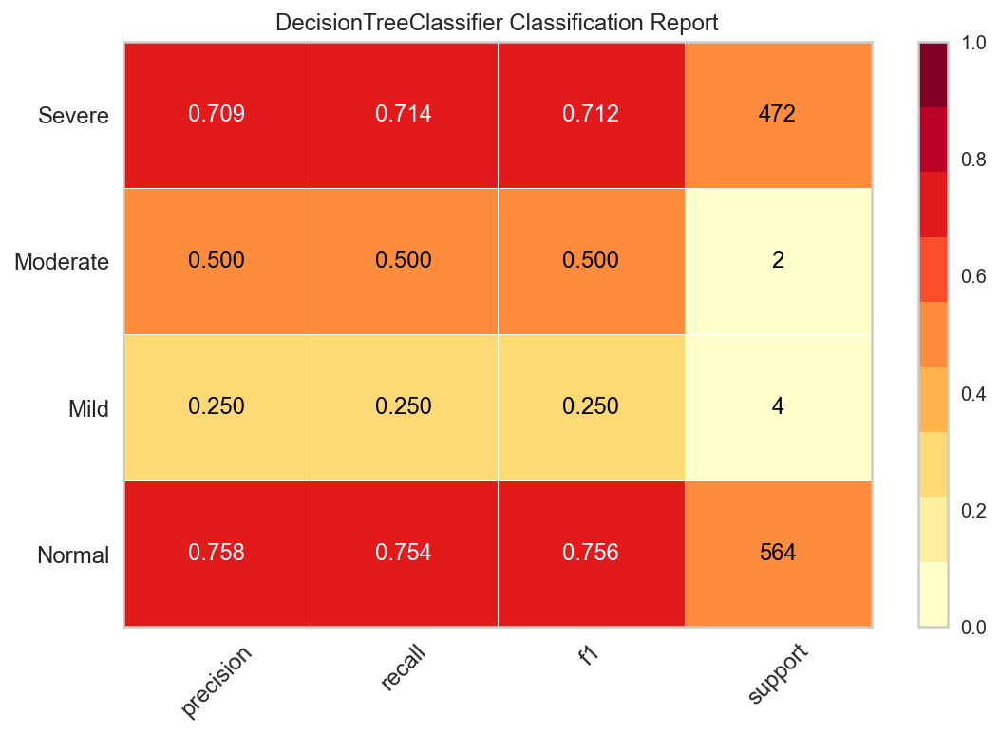

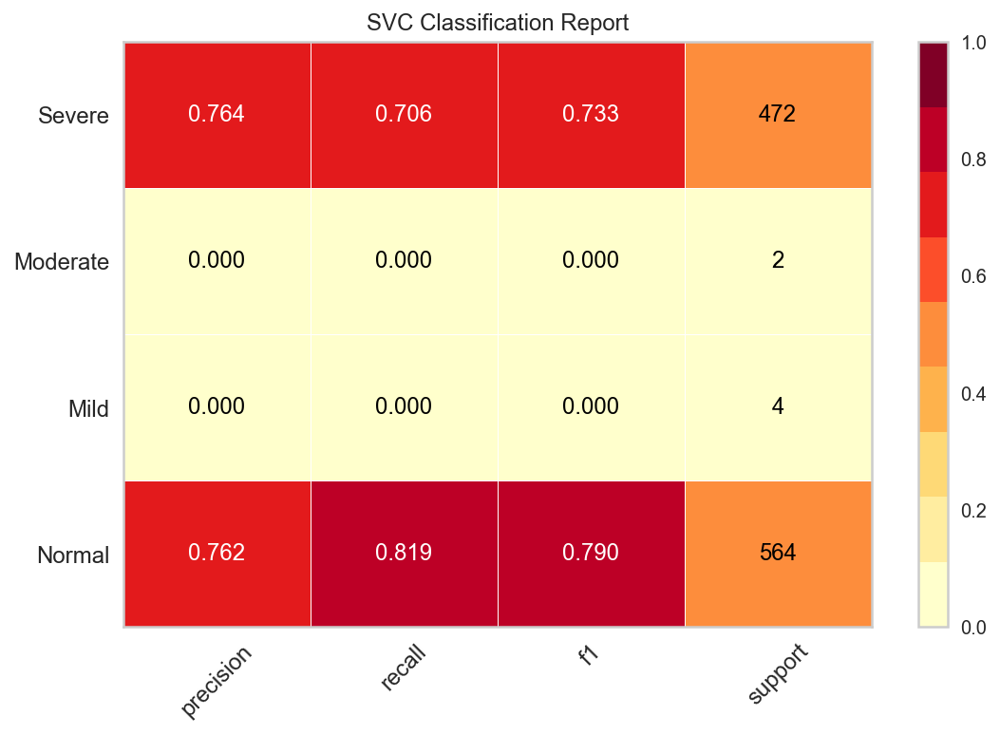

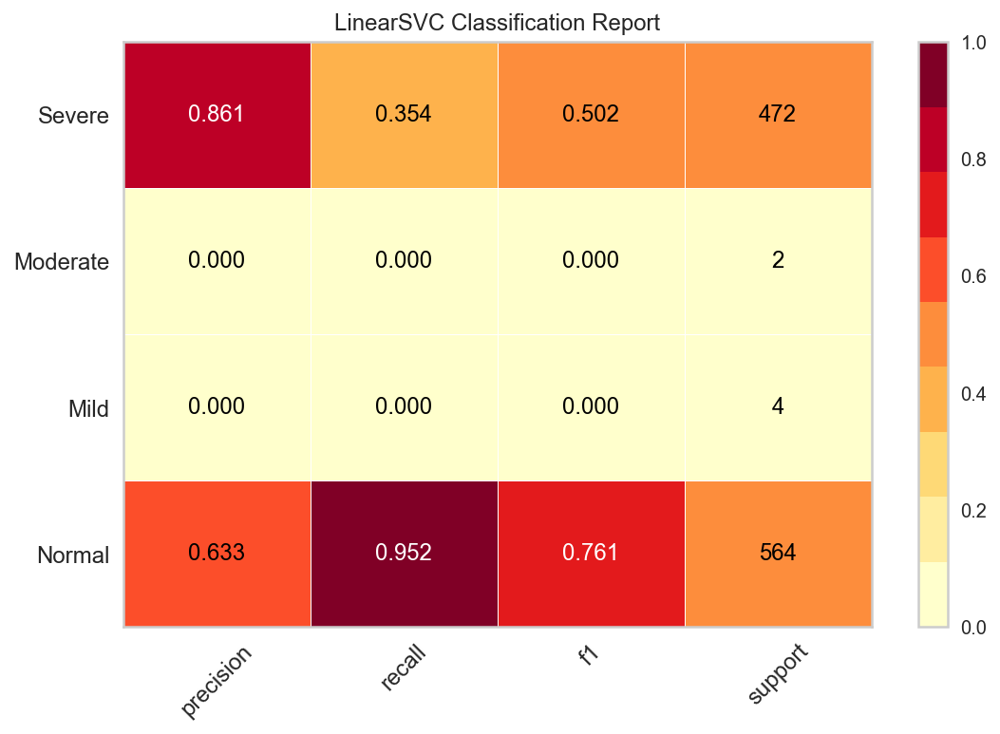

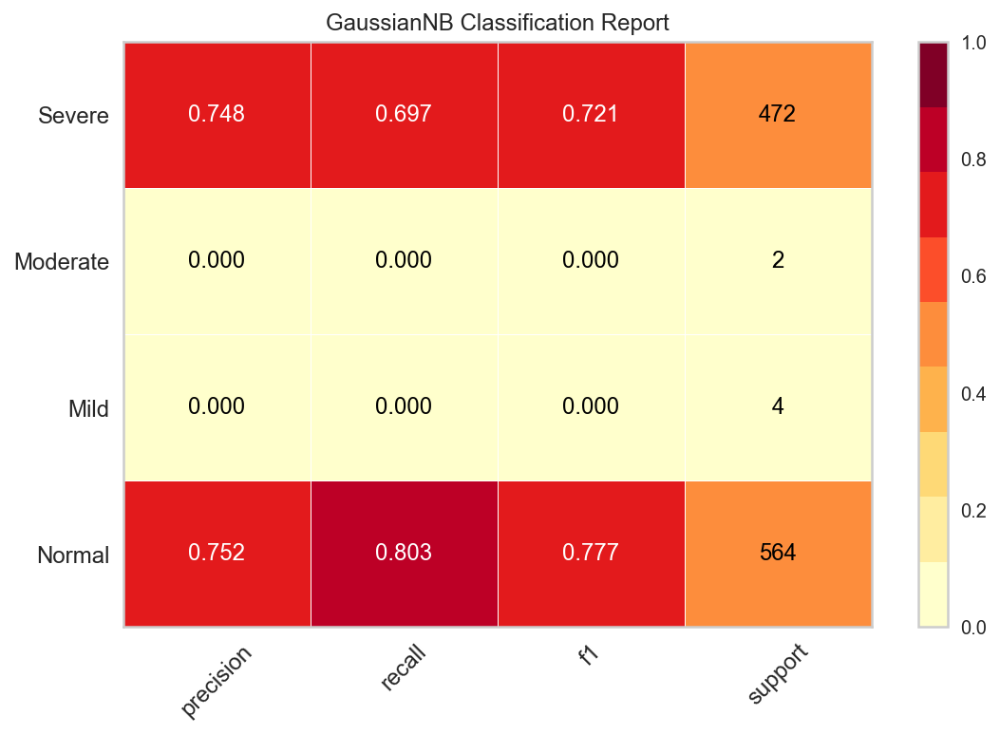

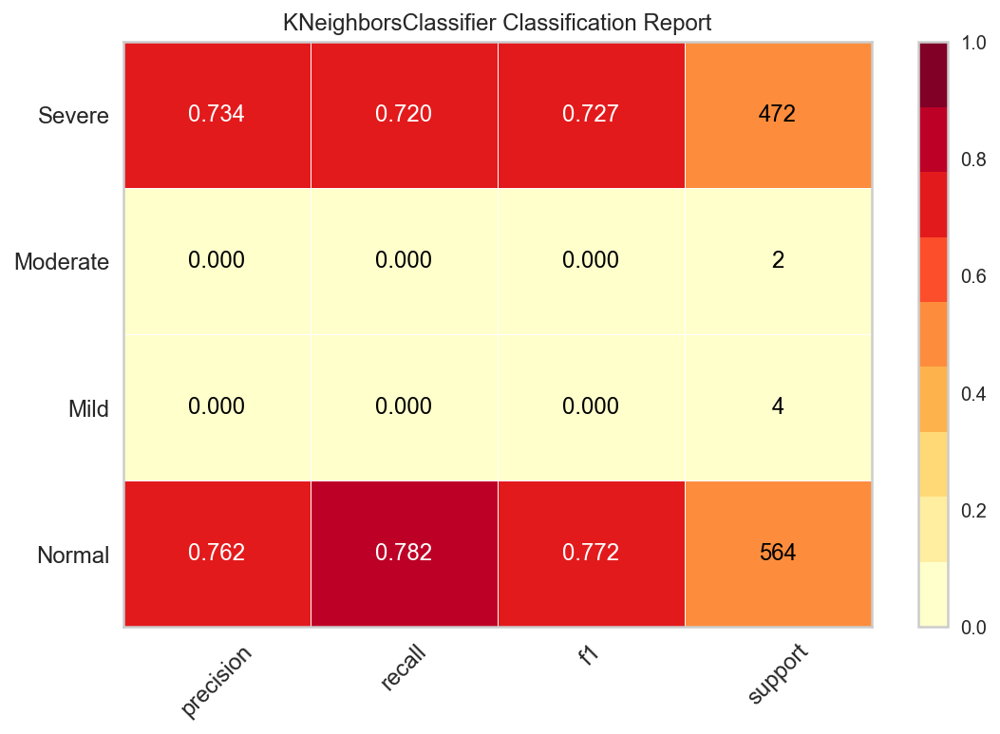

...

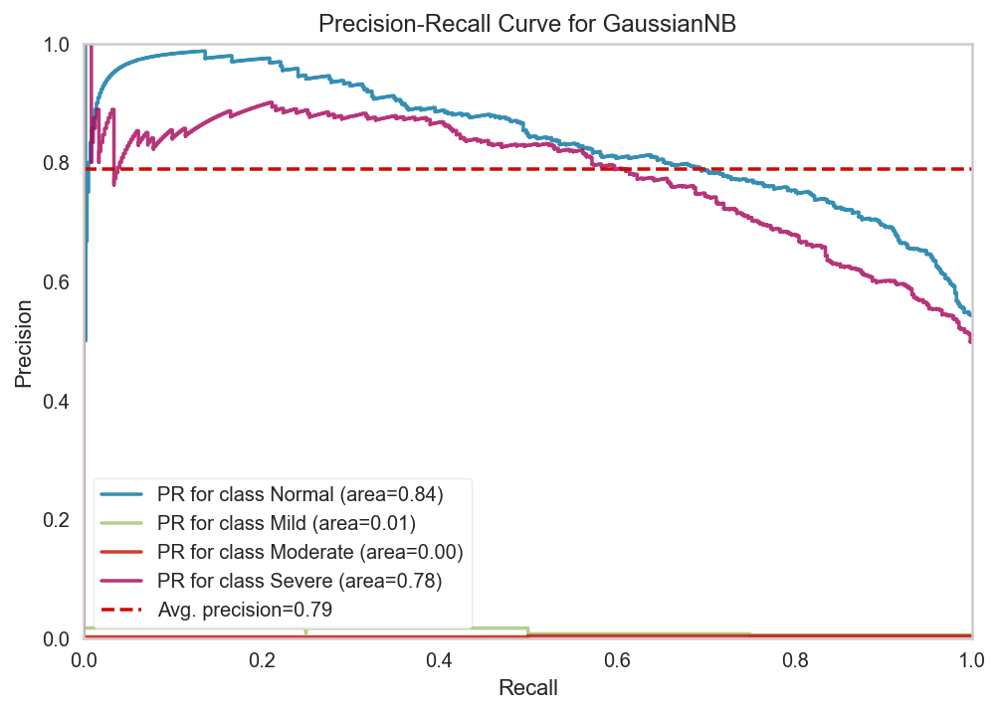

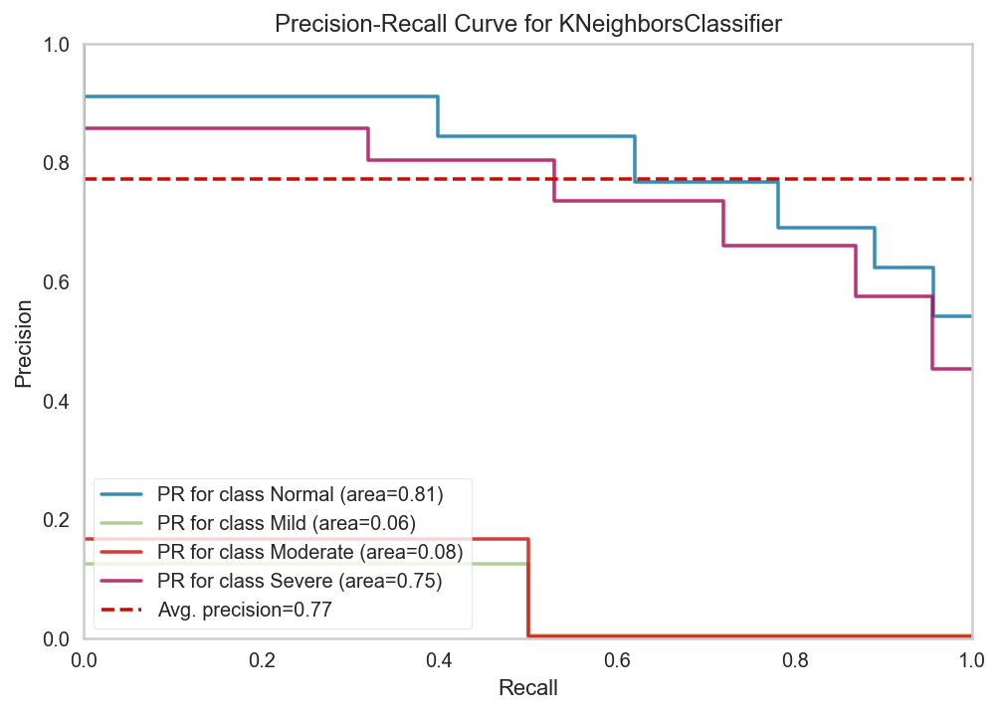

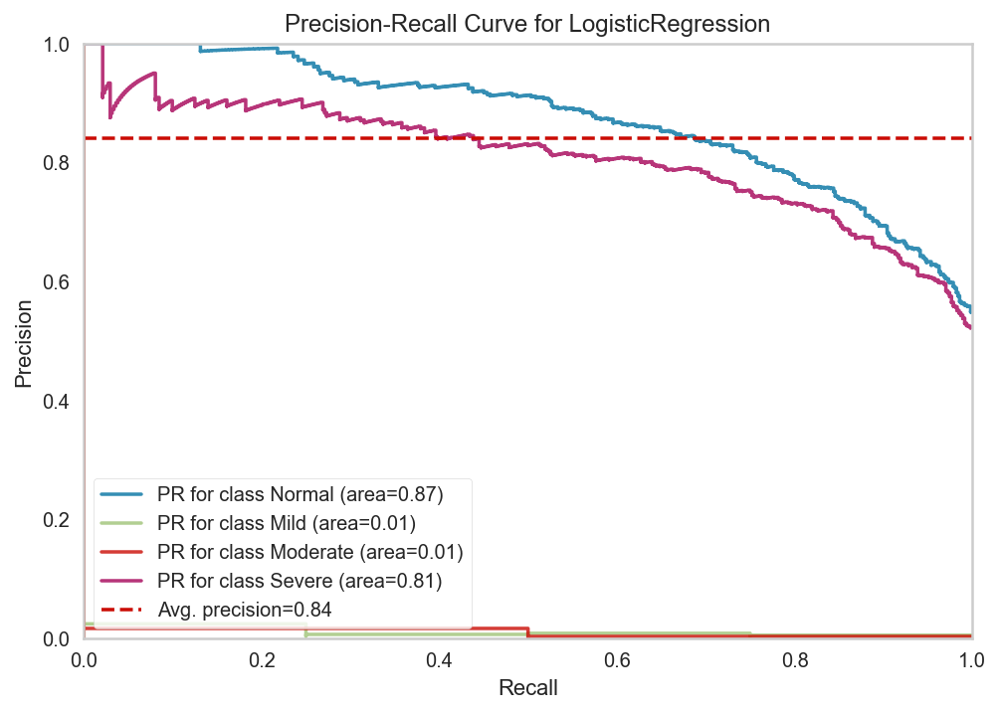

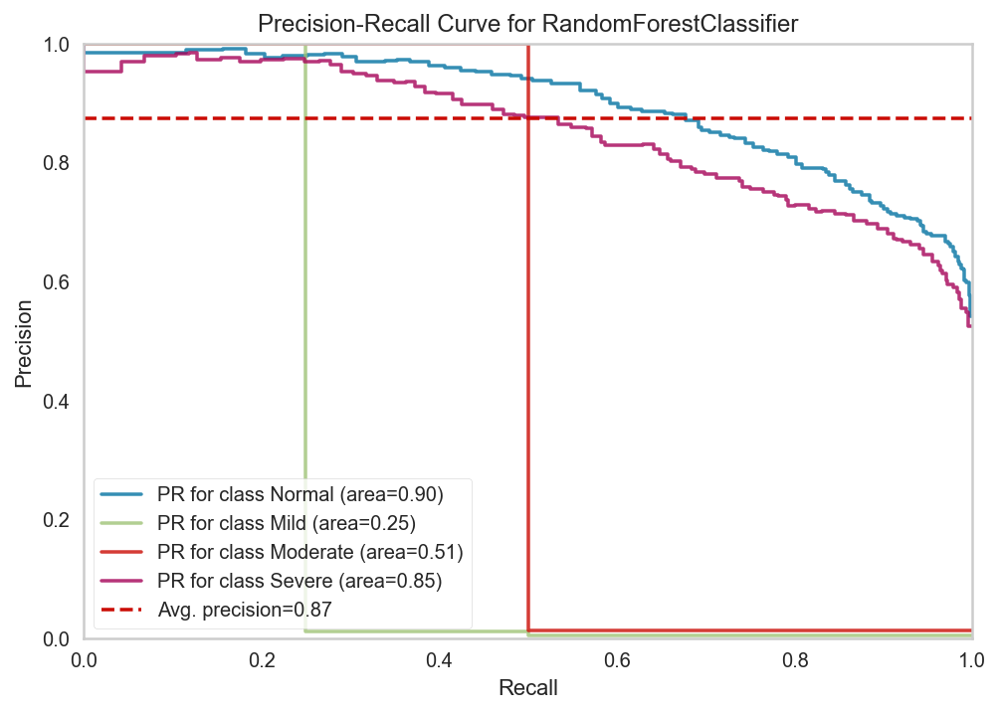

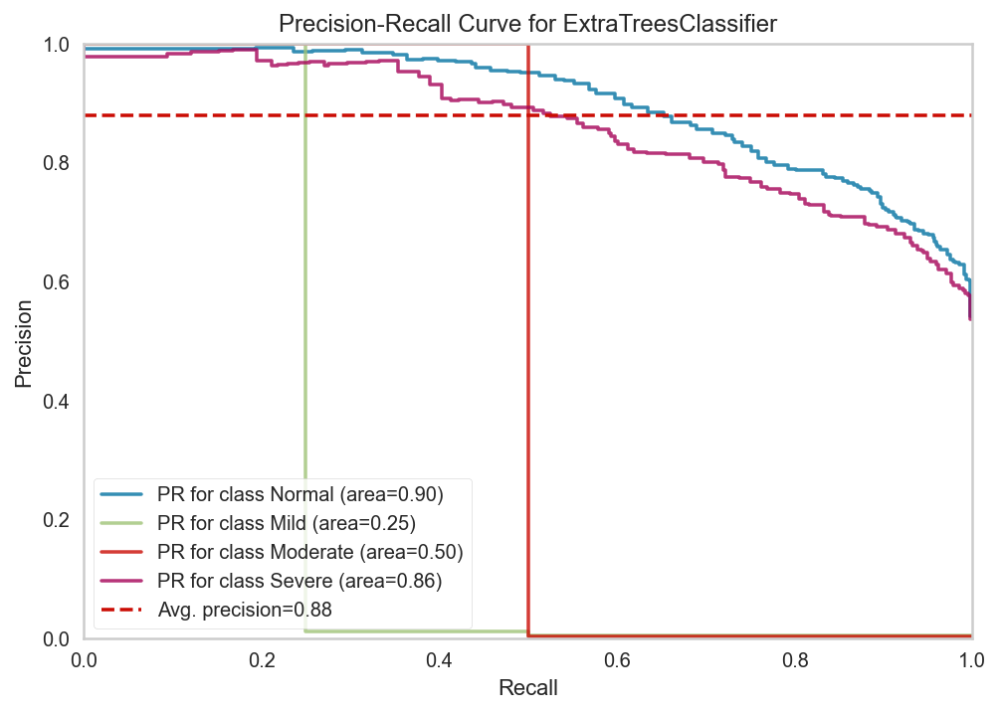

In [33]:
#deploy visualization
visualization =[CR_viz(),CPE_viz(),CM_viz(),ROC_viz(),PRC_viz()]

In [34]:
#Deploy aggregate metrics  
classifier_metrics()

DecisionTreeClassifier(random_state=0)
cohen_kappa_score: 0.469
log_loss: 9.215
zero_one_loss: 0.267
hemming_loss: 0.267
matthews_corrcoef: 0.469

------------------------------------------------------
SVC(random_state=0)
cohen_kappa_score: 0.522
log_loss: 0.000
zero_one_loss: 0.237
hemming_loss: 0.237
matthews_corrcoef: 0.523

------------------------------------------------------
LinearSVC(random_state=0)
cohen_kappa_score: 0.317
log_loss: 0.000
zero_one_loss: 0.324
hemming_loss: 0.324
matthews_corrcoef: 0.387

------------------------------------------------------
GaussianNB()
cohen_kappa_score: 0.497
log_loss: 1.044
zero_one_loss: 0.250
hemming_loss: 0.250
matthews_corrcoef: 0.498

------------------------------------------------------
KNeighborsClassifier()
cohen_kappa_score: 0.497
log_loss: 2.001
zero_one_loss: 0.250
hemming_loss: 0.250
matthews_corrcoef: 0.497

------------------------------------------------------
LogisticRegression(random_state=0)
cohen_kappa_score: 0.523
log_

### IMBLANCED TO BALANCED DATSET

#### CASE-1

In [35]:
X = df.drop('status', axis=1)   # axis=0 for row, axis=1 for column
y = df['status']
y

0       0
1       0
2       0
3       0
4       0
       ..
5203    3
5204    3
5205    3
5206    3
5207    0
Name: status, Length: 5208, dtype: int64

In [36]:
X.shape

(5208, 11)

In [37]:
y.shape

(5208,)

### OVERSAMPLING

In [38]:
from imblearn.over_sampling import SMOTE
strategy = {0:2884, 1:2200, 2:2200, 3:2294}
oversample = SMOTE(sampling_strategy=strategy)
X, y = oversample.fit_resample(X, y)

In [39]:
y
unique, counts = np.unique(y, return_counts=True)
dict(zip(unique, counts))

{0: 2884, 1: 2200, 2: 2200, 3: 2294}

Text(0, 0.5, 'Frequency')

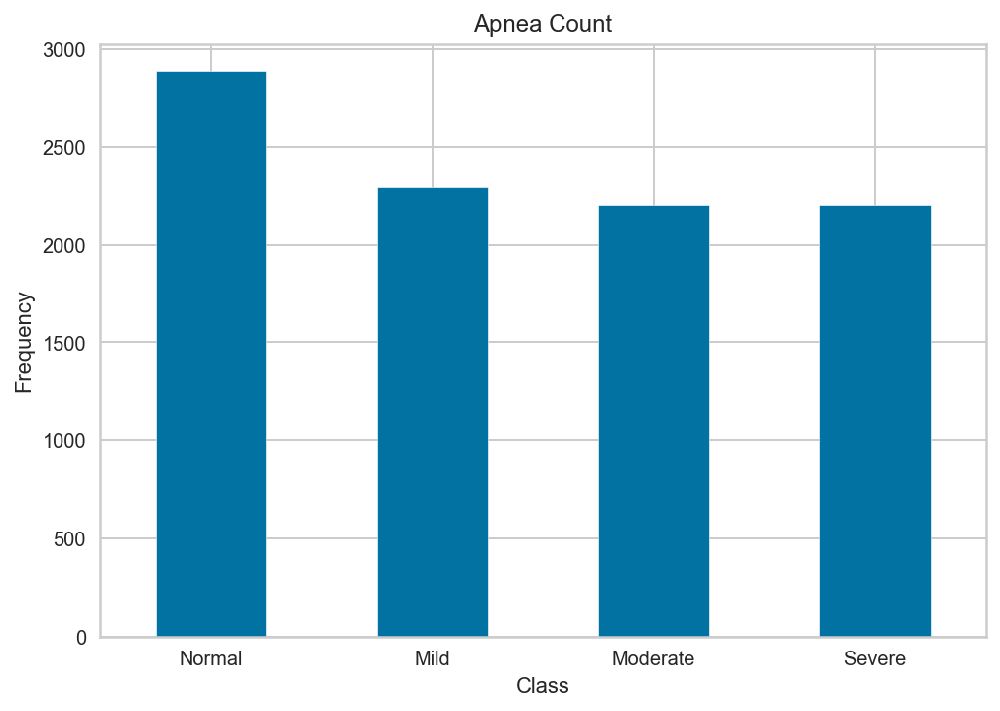

In [40]:
LABELS = ["Normal", "Mild","Moderate","Severe"]

count_classes = pd.value_counts(y, sort = True)

count_classes.plot(kind = 'bar', rot=0)

plt.title("Apnea Count")

plt.xticks(range(4), LABELS)

plt.xlabel("Class")

plt.ylabel("Frequency")

0    2884
3    2294
2    2200
1    2200
Name: status, dtype: int64


<function matplotlib.pyplot.show(close=None, block=None)>

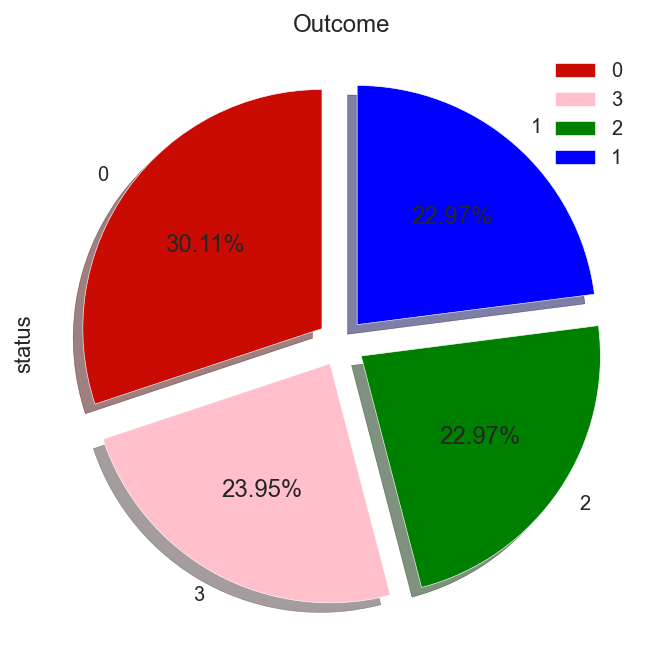

In [41]:
print(y.value_counts())
color=['r',"pink","green","blue"]
y.value_counts().plot.pie(colors=color,startangle=90, shadow=True,explode=(0.1, 0.1, 0.1, 0.1), autopct='%1.2f%%').set_title('Outcome')
plt.legend()
plt.show

In [42]:
a=(y.value_counts()[0] / y.count())*100
a=a.round(3)
print(a)
b=(y.value_counts()[1] / y.count())*100
b=b.round(3)
print(b)
c=(y.value_counts()[2] / y.count())*100
c=c.round(3)
print(c)
d=(y.value_counts()[3] / y.count())*100
d=d.round(3)
print(d)

30.111
22.969
22.969
23.951


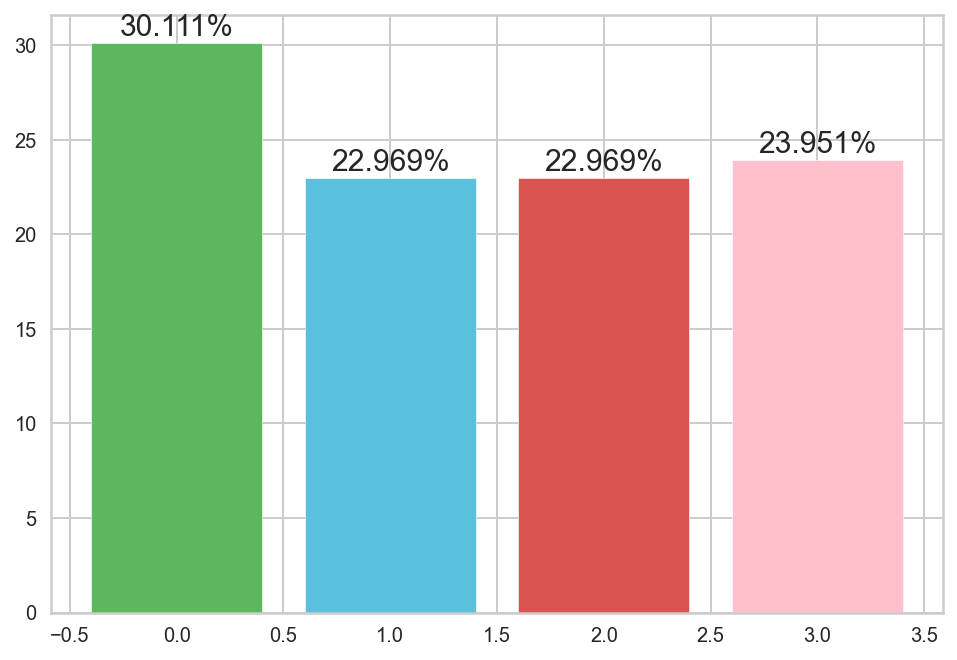

In [43]:
LABELS = ["Normal", "Mild","Moderate","Severe"]
frequencies = (a,b,c,d)

plt.figure()
colors=['#5cb85c','#5bc0de','#d9534f','pink']
p1 = plt.bar(np.arange(len(frequencies)), frequencies,color=colors)

for rect1 in p1:
    height = rect1.get_height()
    plt.annotate( "{}%".format(height),(rect1.get_x() + rect1.get_width()/2, height+.05),ha="center",va="bottom",fontsize=15)

plt.show()


In [44]:
y.shape

(9578,)

In [45]:
X.shape

(9578, 11)

In [46]:
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(12,'Score'))  #print 10 best features

      Specs        Score
3    Weight  5872.744303
7     Waist  3996.062338
9       Age  2552.828248
2       BMI  1443.699185
1       ESS  1001.857486
8   Buttock   929.606253
6      Neck   897.659331
0        BQ   519.374710
10        M   348.800712
4    Height   213.568554
5      Head    50.232644


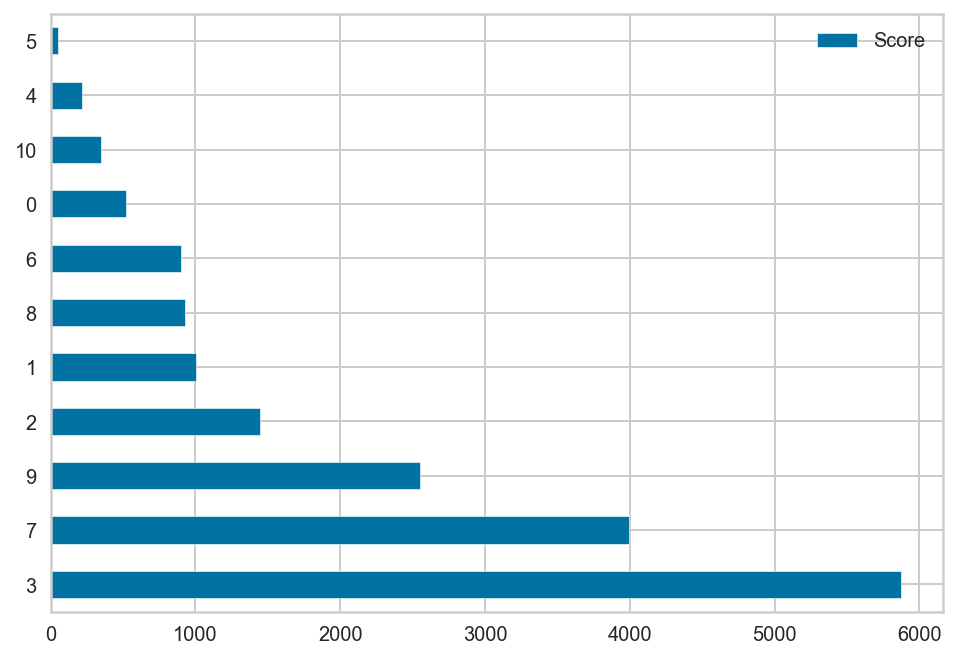

In [47]:
featureScores.nlargest(12,'Score').plot(kind='barh')
plt.show()

[0.03020839 0.09309457 0.09836417 0.09383201 0.09809794 0.0958287
 0.10346924 0.12949896 0.08617434 0.12550307 0.04592861]


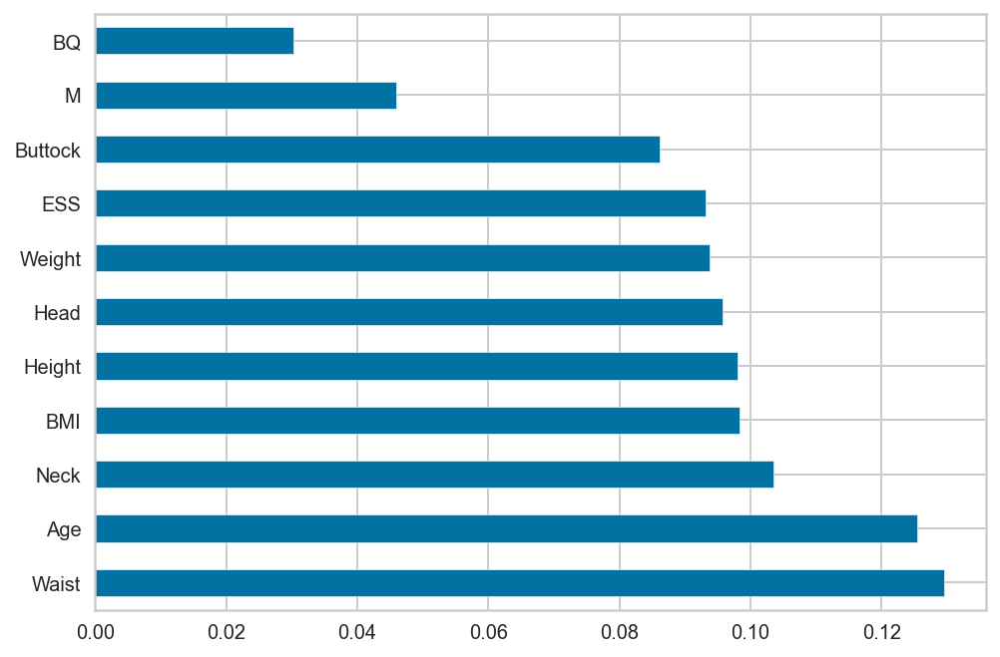

In [48]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(12).plot(kind='barh')
plt.show()

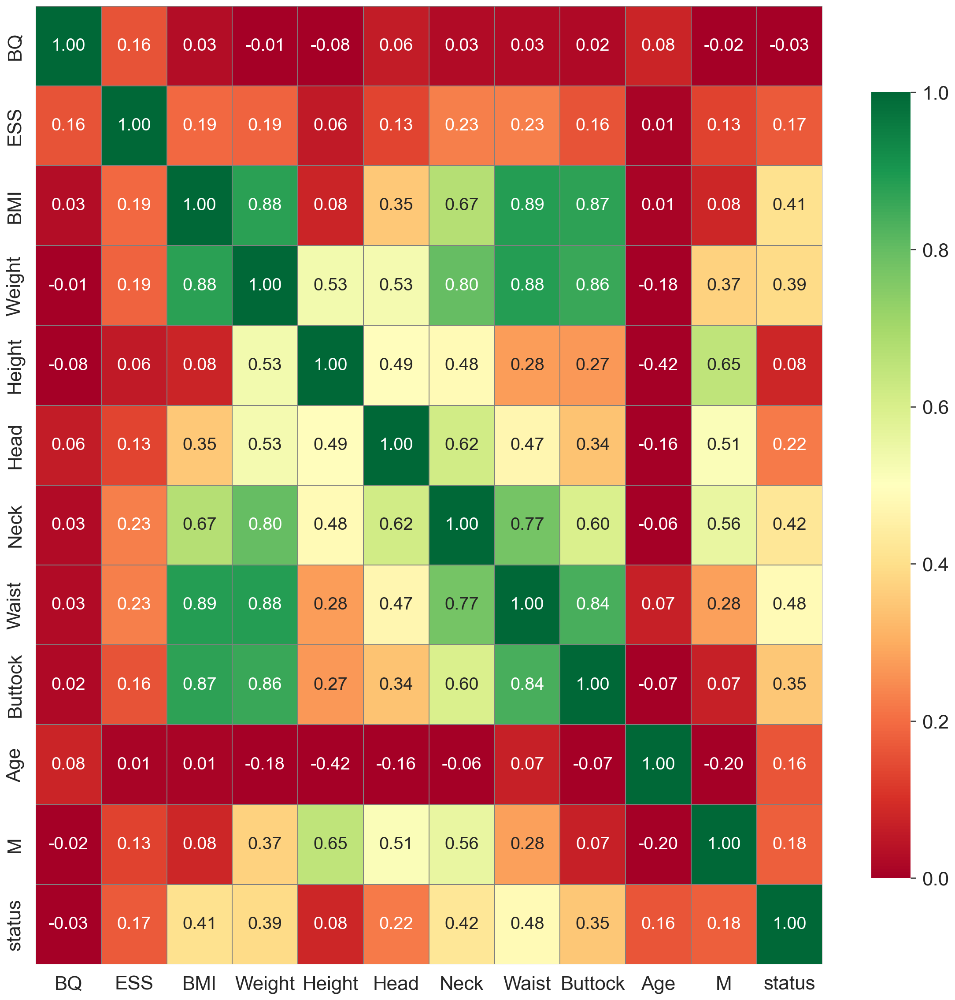

In [85]:
corrmat = df1.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
sns.set(font_scale=2)
g=sns.heatmap(df1[top_corr_features].corr(),annot=True,cmap="RdYlGn",vmin=0.0, vmax=1.0, 
                  annot_kws={"size": 20},
                  fmt='.2f', cbar_kws={"shrink": .82},
                  linewidths=0.1, linecolor='gray')

In [86]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (7662, 11)
y_train (7662,)
X_test (1916, 11)
y_test (1916,)


In [87]:
def evaluate(model, X_test , y_test,modelname):
  y_pred1=model.predict(X_test)
  #precision    = precision_score(y_test, y_pred1)
 # recall       = recall_score(y_test, y_pred1)
 # f1score      = f1_score(y_test, y_pred1) 
 # rocauc       = roc_auc_score(y_test, y_pred1)
  #logloss      = log_loss(y_test, y_pred1)
  accuracy     = accuracy_score(y_test, y_pred1)
  classification =classification_report(y_test, y_pred1)
  confusion    = confusion_matrix(y_test, y_pred1)

  df_model1 = pd.DataFrame({  'model'        : [modelname],
                             'accuracy'     : [accuracy],
                            'classification':[classification],
                             #'precision'    : [precision],
                             #'recall'       : [recall],
                             #'f1score'      : [f1score],
                             #'rocauc'       : [rocauc],
                            # 'logloss'      : [logloss],
                             'timetaken'    : [time2],
                            'confusionmatrix' : [confusion]
                            
                                }) 
  return df_model1

In [88]:
%%time
time2=time.time()
print("base model")
base_model = RandomForestClassifier(random_state=0)
base_model.fit(X_train, y_train)
#base_accuracy = evaluate(base_model, X_test, y_test,modelname)
model1 = evaluate(base_model,  X_test,  y_test, 'RandomForest')
model1.timetaken[0] = time.time() - time2
print("Random Forest")
print(base_model.get_params())
print(model1)

base model
Random Forest
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
          model  accuracy                                     classification  \
0  RandomForest  0.890397                precision    recall  f1-score   ...   

   timetaken                                    confusionmatrix  
0   0.958076  [[515, 4, 0, 86], [2, 427, 0, 0], [0, 0, 415, ...  
Wall time: 961 ms


In [89]:
%%time
from sklearn.ensemble import ExtraTreesClassifier

time2=time.time()
print("base model")
base_model1 = ExtraTreesClassifier(random_state=0)
base_model1.fit(X_train, y_train)
model2 = evaluate(base_model1,  X_test,  y_test, 'Extra Tree')
model2.timetaken[0] = time.time() - time2
print("Extra Tree")
print(base_model1.get_params())

base model
Extra Tree
{'bootstrap': False, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
Wall time: 521 ms


In [90]:
%%time
time2=time.time()
print("base model")
base_model2 = LogisticRegression(random_state=0)
base_model2.fit(X_train, y_train)
model3 = evaluate(base_model2,  X_test,  y_test, 'Logistic Regression')
model3.timetaken[0] = time.time() - time2
print("Logoistic Regression")
print(base_model2.get_params())

base model
Logoistic Regression
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 0, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Wall time: 347 ms


In [91]:
%%time
time2=time.time()
print("base model")
base_model3 = KNeighborsClassifier()
base_model3.fit(X_train, y_train)
model4 = evaluate(base_model3,  X_test,  y_test, 'KNN')
model4.timetaken[0] = time.time() - time2
print("KNN")
print(base_model3.get_params())

base model
KNN
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
Wall time: 91 ms


In [92]:
%%time
time2=time.time()
print("base model")
base_model4 = LinearSVC(random_state=0)
base_model4.fit(X_train, y_train)
model5 = evaluate(base_model4,  X_test,  y_test, 'LinearSVC')
model5.timetaken[0] = time.time() - time2
print("LinearSVC")
print(base_model4.get_params())

base model
LinearSVC
{'C': 1.0, 'class_weight': None, 'dual': True, 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': 0, 'tol': 0.0001, 'verbose': 0}
Wall time: 1.06 s


In [93]:
%%time
time2=time.time()
print("base model")
base_model5 = GaussianNB()
base_model5.fit(X_train, y_train)
model6 = evaluate(base_model5,  X_test,  y_test, 'GaussianNB')
model6.timetaken[0] = time.time() - time2
print("GaussianNB")
print(base_model5.get_params())

base model
GaussianNB
{'priors': None, 'var_smoothing': 1e-09}
Wall time: 10.2 ms


In [94]:
%%time
time2=time.time()
print("base model")
base_model6=SVC(random_state=0)
base_model6.fit(X_train, y_train)
model7 = evaluate(base_model6,  X_test,  y_test, 'SVC')
model7.timetaken[0] = time.time() - time2
print("SVC")
print(base_model6.get_params())

base model
SVC
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': 0, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Wall time: 2.71 s


In [95]:
%%time
time2=time.time()
print("base model")
base_model7=DecisionTreeClassifier(random_state=0)
base_model7.fit(X_train, y_train)
model8 = evaluate(base_model7,  X_test,  y_test, 'Decision Tree')
model8.timetaken[0] = time.time() - time2
print("Decision Tree")
print(base_model7.get_params())

base model
Decision Tree
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 0, 'splitter': 'best'}
Wall time: 68.8 ms


In [96]:
df_base= pd.concat([model1,model2,model3,model4,model5,model6,model7,model8],axis = 0).reset_index()
df_base.drop('index', axis=1, inplace=True)
df_base

,model,accuracy,classification,timetaken,confusionmatrix
0,RandomForest,0.890397,precision recall f1-score ...,0.958076,"[[515, 4, 0, 86], [2, 427, 0, 0], [0, 0, 415, ..."
1,Extra Tree,0.893528,precision recall f1-score ...,0.521445,"[[513, 3, 3, 86], [0, 429, 0, 0], [0, 0, 415, ..."
2,Logistic Regression,0.528184,precision recall f1-score ...,0.347032,"[[274, 139, 91, 101], [154, 189, 46, 40], [142..."
3,KNN,0.805324,precision recall f1-score ...,0.090997,"[[372, 77, 39, 117], [0, 429, 0, 0], [0, 0, 41..."
4,LinearSVC,0.409708,precision recall f1-score ...,1.055760,"[[34, 215, 3, 353], [1, 293, 0, 135], [0, 79, ..."
5,GaussianNB,0.552714,precision recall f1-score ...,0.010250,"[[215, 211, 86, 93], [53, 338, 29, 9], [41, 14..."
6,SVC,0.551148,precision recall f1-score ...,2.708603,"[[252, 172, 101, 80], [72, 253, 78, 26], [51, ..."
7,Decision Tree,0.817328,precision recall f1-score ...,0.060648,"[[418, 20, 13, 154], [9, 418, 0, 2], [5, 1, 40..."


In [97]:
df_base
df_base.to_csv('D:\MAJOR PROJECT\datasets\Balanced_data1_performance_metrics.csv')

In [98]:
X

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1
...,...,...,...,...,...,...,...,...,...,...,...
9573,0,11,24.307678,65.691866,164.345933,56.224322,36.654067,86.032456,95.551356,50.783892,1
9574,0,14,28.313932,74.733581,162.427922,56.885584,38.366790,95.408302,101.061132,39.061132,1
9575,0,11,28.651078,75.737352,162.579117,55.178472,34.525297,95.210441,109.107640,51.740578,0
9576,0,13,28.290001,74.356073,162.118691,56.467666,37.287855,95.440655,102.661672,41.611199,0


In [99]:
y

0       0
1       0
2       0
3       0
4       0
       ..
9573    2
9574    2
9575    2
9576    2
9577    2
Name: status, Length: 9578, dtype: int64

In [100]:
df1 = pd.concat([X,y],axis='columns')
df1.head()

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.0,174.0,57.5,39.0,95.5,106.5,20.0,1,0
1,0,8,26.989619,78.0,170.0,57.0,36.5,90.0,100.0,20.0,1,0
2,0,16,23.939481,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0


In [101]:
df1.shape

(9578, 12)

In [102]:
df1

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1,0
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1,0
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1,0
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,11,24.307678,65.691866,164.345933,56.224322,36.654067,86.032456,95.551356,50.783892,1,2
9574,0,14,28.313932,74.733581,162.427922,56.885584,38.366790,95.408302,101.061132,39.061132,1,2
9575,0,11,28.651078,75.737352,162.579117,55.178472,34.525297,95.210441,109.107640,51.740578,0,2
9576,0,13,28.290001,74.356073,162.118691,56.467666,37.287855,95.440655,102.661672,41.611199,0,2


In [103]:
# libraries 
#!pip install yellowbrick
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split

#Visualizers
from yellowbrick.classifier import ClassificationReport
from yellowbrick.classifier import ClassPredictionError
from yellowbrick.classifier import ConfusionMatrix
from yellowbrick.classifier import ROCAUC
from yellowbrick.classifier import PrecisionRecallCurve
import matplotlib.pyplot as plt

#Metrics
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import hamming_loss
from sklearn.metrics import log_loss
from sklearn.metrics import zero_one_loss
from sklearn.metrics import matthews_corrcoef
#Classifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB 
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

In [104]:
classes =  ["Normal", "Mild","Moderate","Severe"]
classes

['Normal', 'Mild', 'Moderate', 'Severe']

In [105]:
classifiers=[
DecisionTreeClassifier(random_state=0),
SVC(random_state=0),
LinearSVC(random_state=0),
GaussianNB(),
KNeighborsClassifier(),
LogisticRegression(random_state=0),
RandomForestClassifier(random_state=0),
ExtraTreesClassifier(random_state=0)]


In [106]:
#Write function for class-centric metrics
# Classification report
def CR_viz():
    def Class_report(model,classes):
        visualizer = ClassificationReport(model, classes=classes, support=True)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        visualizer.score(X_test, y_test)
        #visualizer.score(y_test, x_test)  # Evaluate the model on the test data
        return visualizer.poof()
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        Class_report(name,classes)

#Class Prediction Error
def CPE_viz():    
    def CPE(model,classes):
        visualizer = ClassPredictionError(model, classes=classes)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        #visualizer.score(y_test, x_test)  # Evaluate the model on the test data 
        visualizer.score(X_test, y_test)
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CPE(name,classes)
        
#Confusion matrix
def CM_viz():    
    def CM(model,classes):
        visualizer = ConfusionMatrix(model, classes=classes,percent=True)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        visualizer.score(X_test, y_test)
        #visualizer.score(y_test,  x_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CM(name,classes)
        
#ROC-AUC
def ROC_viz():    
    def ROC(model,classes):
        visualizer = ROCAUC(model, classes=classes)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        visualizer.score(X_test, y_test)
        #visualizer.score(y_test, x_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        ROC(name,classes)

#Precision Recall Curve
def PRC_viz():  
    def PRC(model,classes):
        visualizer = PrecisionRecallCurve(model,classes=classes, per_class=True, iso_f1_curves=False,
    fill_area=False, micro=False)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        #x_test=visualizer.predict(X_test)
        visualizer.score(X_test, y_test)
        #visualizer.score(y_test, x_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        PRC(name,classes)


In [107]:
# Write function for aggregate metrics
def classifier_metrics():    
    def metrics(model):
        #     model=model_name()
        model.fit(X_train, y_train)  # Fit the visualizer and the model
        y_pred = model.predict(X_test)
        try: 
            y_prob = model.predict_proba(X_test)
            log_metric = log_loss(y_test,y_prob)
        except:
            y_prob = "Not probablistic"
            log_metric = 0
        else:
            y_pred = model.predict(X_test)
        c_k_s=cohen_kappa_score(y_test,y_pred)
        zero_met=zero_one_loss(y_test,y_pred)
        hl=hamming_loss(y_test,y_pred)
        mc=matthews_corrcoef(y_test,y_pred)
        print('cohen_kappa_score: {0:.3f}'.format(c_k_s))
        print('log_loss: {0:.3f}'.format(log_metric))
        print('zero_one_loss: {0:.3f}'.format(zero_met))
        print('hemming_loss: {0:.3f}'.format(hl))
        print('matthews_corrcoef: {0:.3f}'.format(mc))
    for name in classifiers:
        print (str(name))
        metrics(name)
        print()
        print ("------------------------------------------------------")

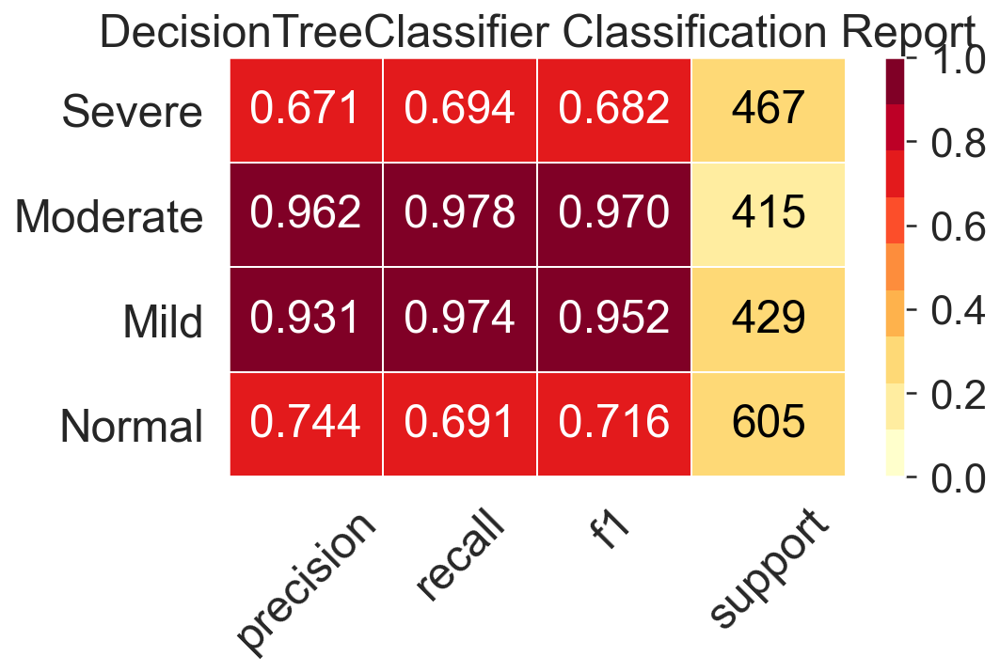

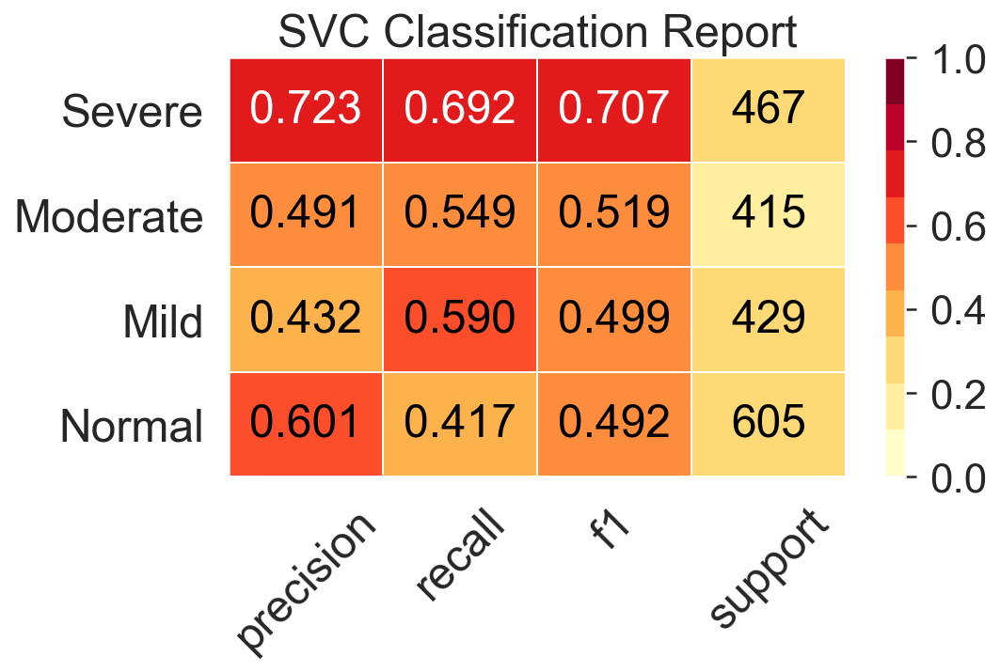

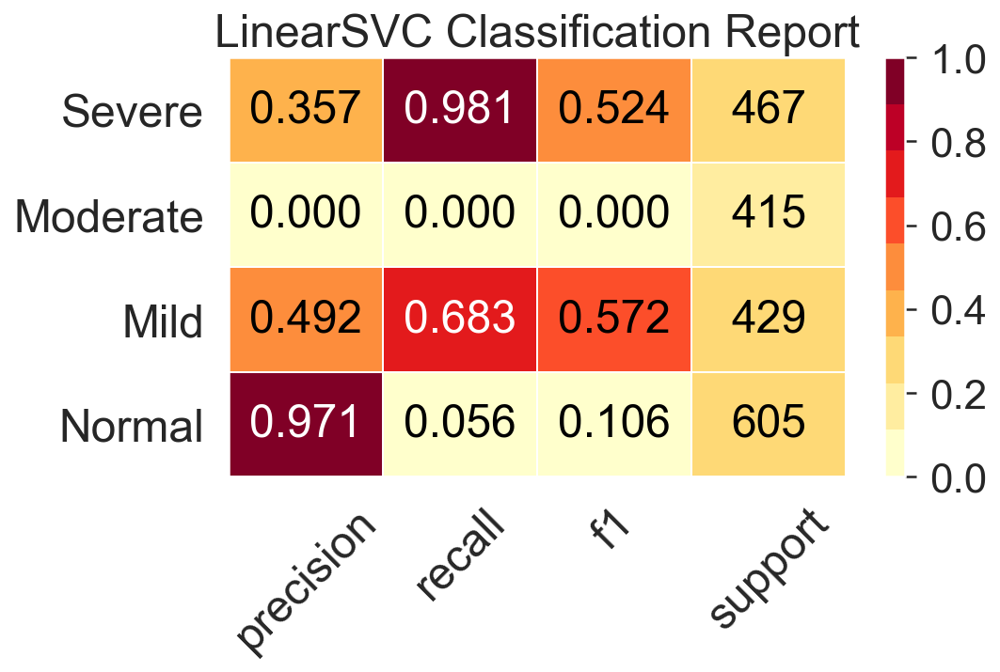

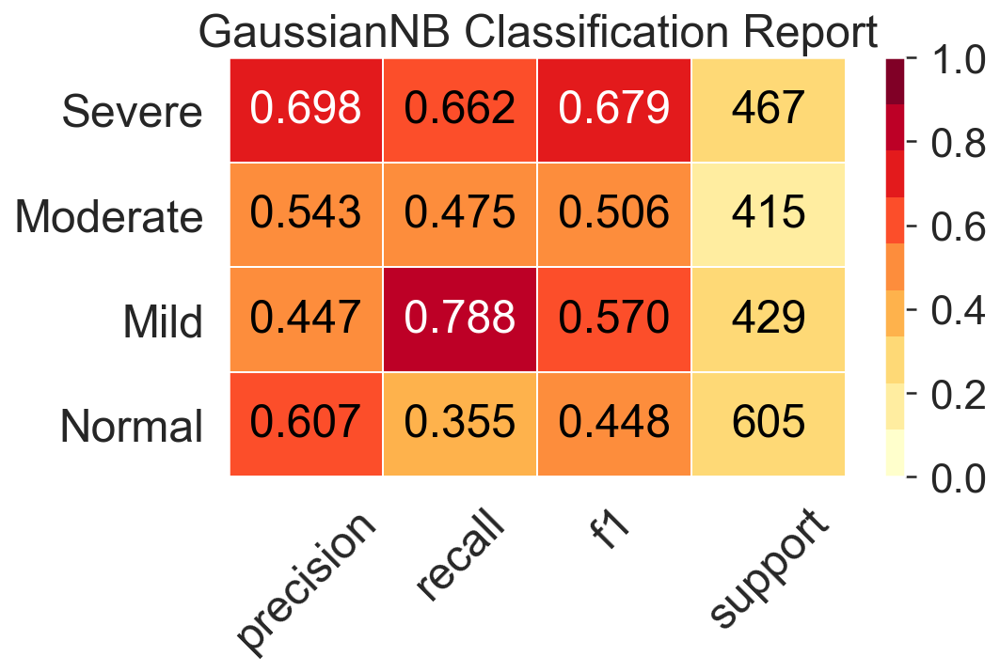

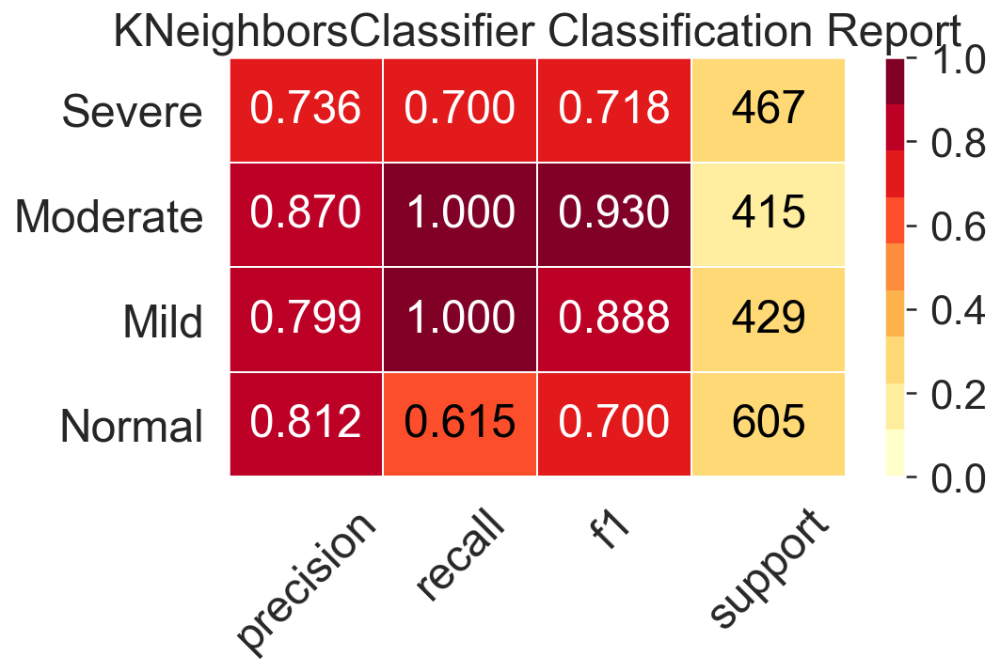

...

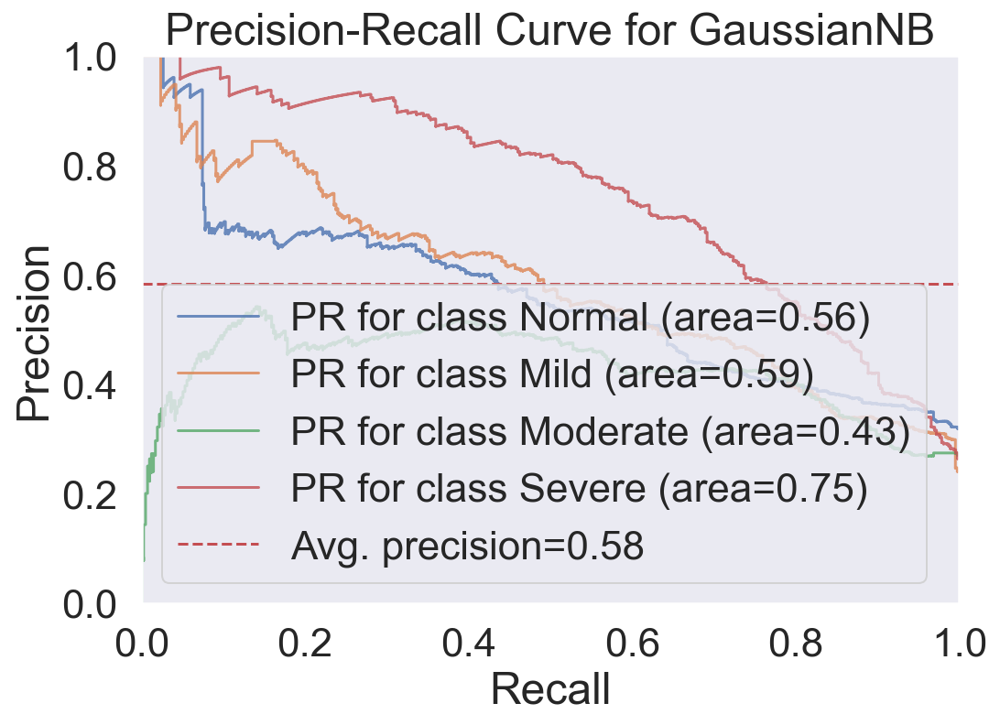

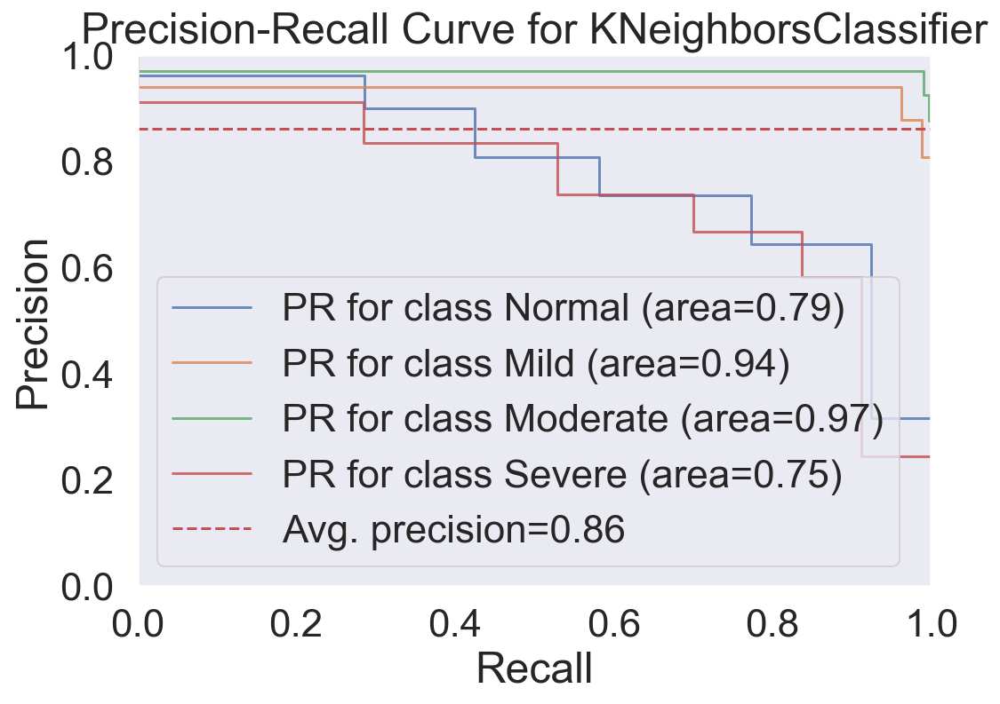

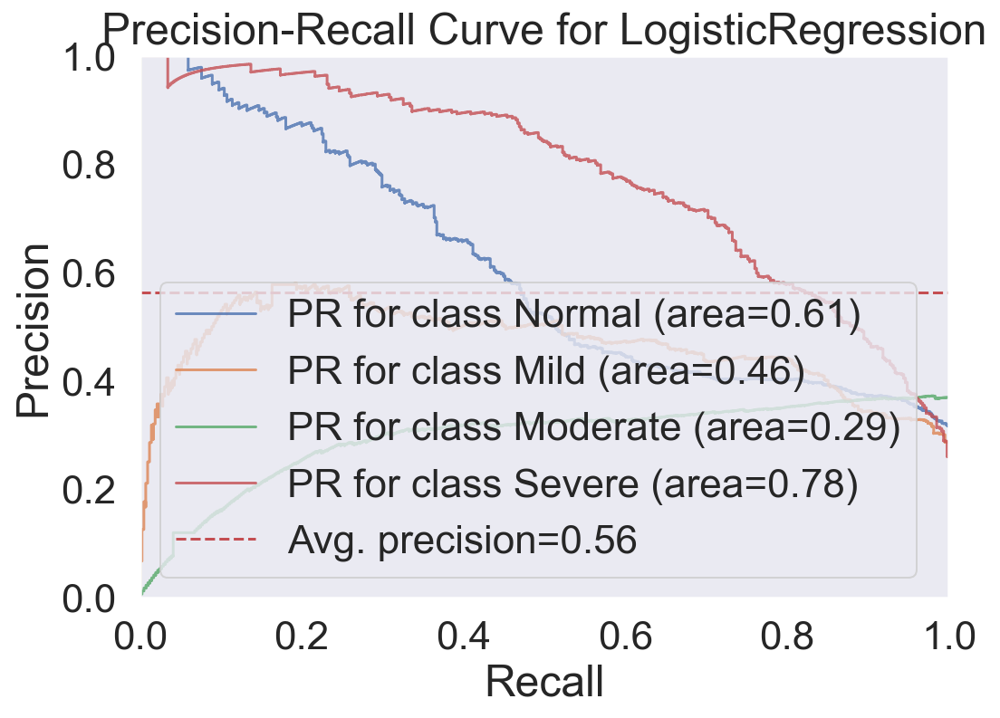

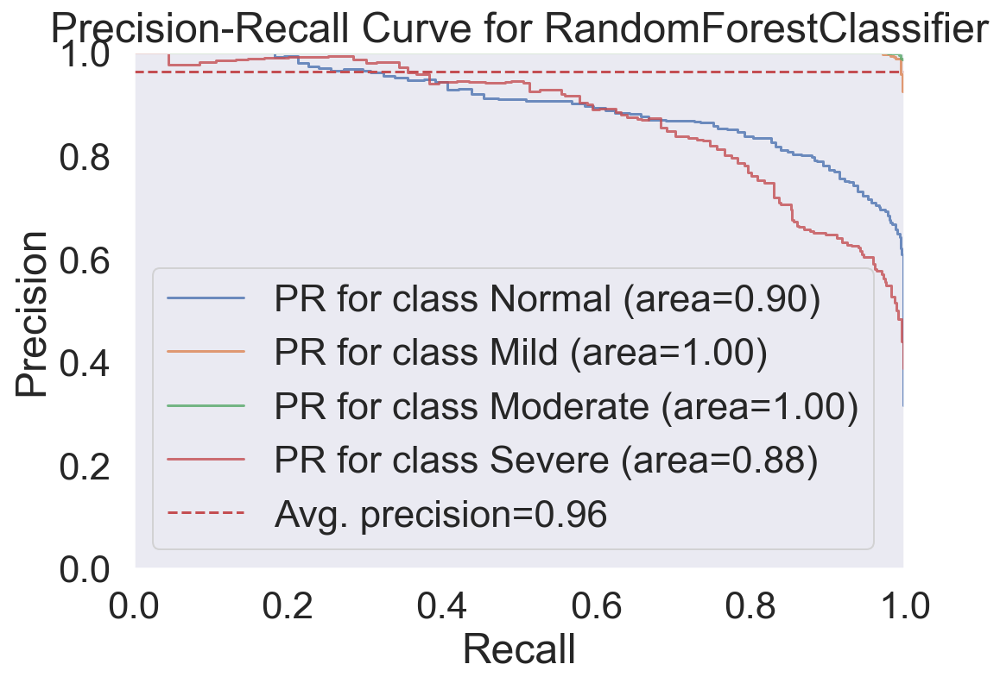

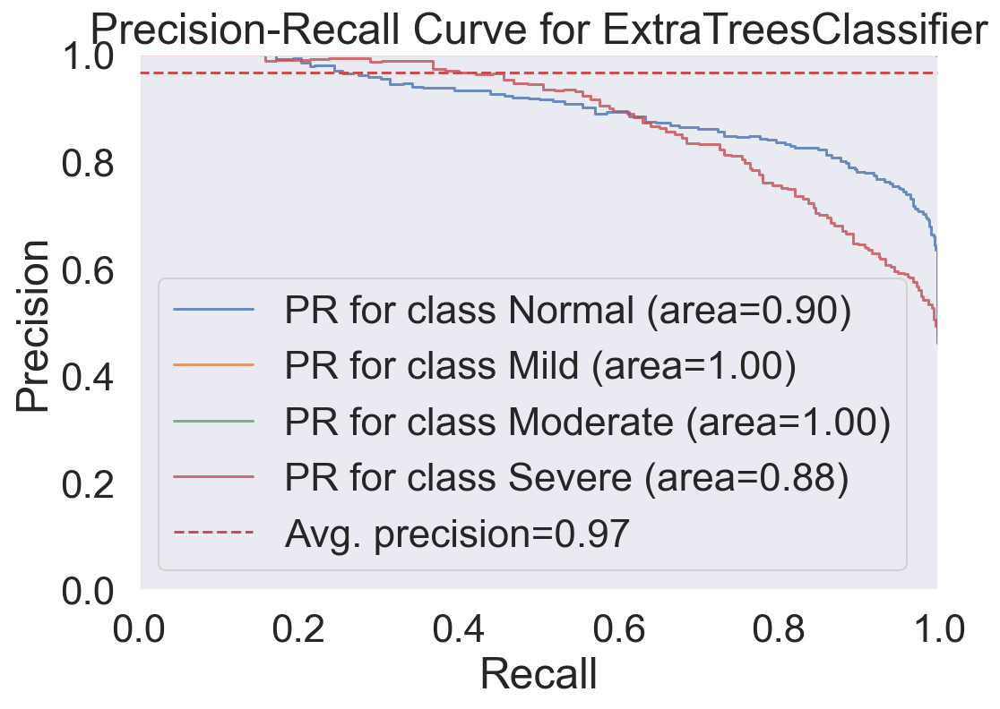

In [108]:
#deploy visualization
visualization =[CR_viz(),CPE_viz(),CM_viz(),ROC_viz(),PRC_viz()]

In [109]:
#Deploy aggregate metrics  
classifier_metrics()

DecisionTreeClassifier(random_state=0)
cohen_kappa_score: 0.755
log_loss: 6.309
zero_one_loss: 0.183
hemming_loss: 0.183
matthews_corrcoef: 0.755

------------------------------------------------------
SVC(random_state=0)
cohen_kappa_score: 0.404
log_loss: 0.000
zero_one_loss: 0.449
hemming_loss: 0.449
matthews_corrcoef: 0.409

------------------------------------------------------
LinearSVC(random_state=0)
cohen_kappa_score: 0.224
log_loss: 0.000
zero_one_loss: 0.590
hemming_loss: 0.590
matthews_corrcoef: 0.294

------------------------------------------------------
GaussianNB()
cohen_kappa_score: 0.408
log_loss: 1.491
zero_one_loss: 0.447
hemming_loss: 0.447
matthews_corrcoef: 0.421

------------------------------------------------------
KNeighborsClassifier()
cohen_kappa_score: 0.741
log_loss: 1.833
zero_one_loss: 0.195
hemming_loss: 0.195
matthews_corrcoef: 0.746

------------------------------------------------------
LogisticRegression(random_state=0)
cohen_kappa_score: 0.364
log_

In [94]:
df1.to_csv('D:\MAJOR PROJECT\datasets\sampled_dataset.csv')
df1.shape

(9578, 12)

#### CASE-2

In [95]:
df2=pd.read_csv('preprocessed_datset.csv') 
df2.head()


,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.0,174.0,57.5,39.0,95.5,106.5,20.0,1,0
1,0,8,26.989619,78.0,170.0,57.0,36.5,90.0,100.0,20.0,1,0
2,0,16,23.939481,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0


In [96]:
df2.shape

(5208, 12)

In [97]:
p=df2.drop('status',axis=1)
q=df2['status']

In [98]:
p.shape

(5208, 11)

In [99]:
oversample = SMOTE()
p, q = oversample.fit_resample(p, q)

Class=0, n=2884 (25.000%)
Class=3, n=2884 (25.000%)
Class=2, n=2884 (25.000%)
Class=1, n=2884 (25.000%)


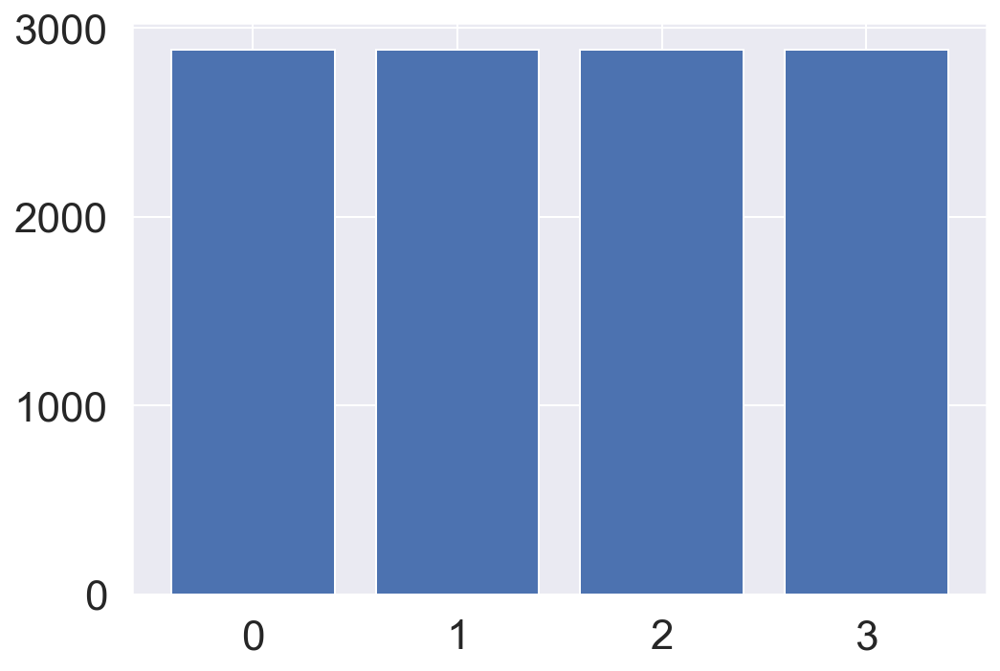

In [100]:
from collections import Counter
from matplotlib import pyplot
counter = Counter(q)
for k,v in counter.items():
	per = v / len(q) * 100
	print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
pyplot.bar(counter.keys(), counter.values())
pyplot.show()

Text(0, 0.5, 'Frequency')

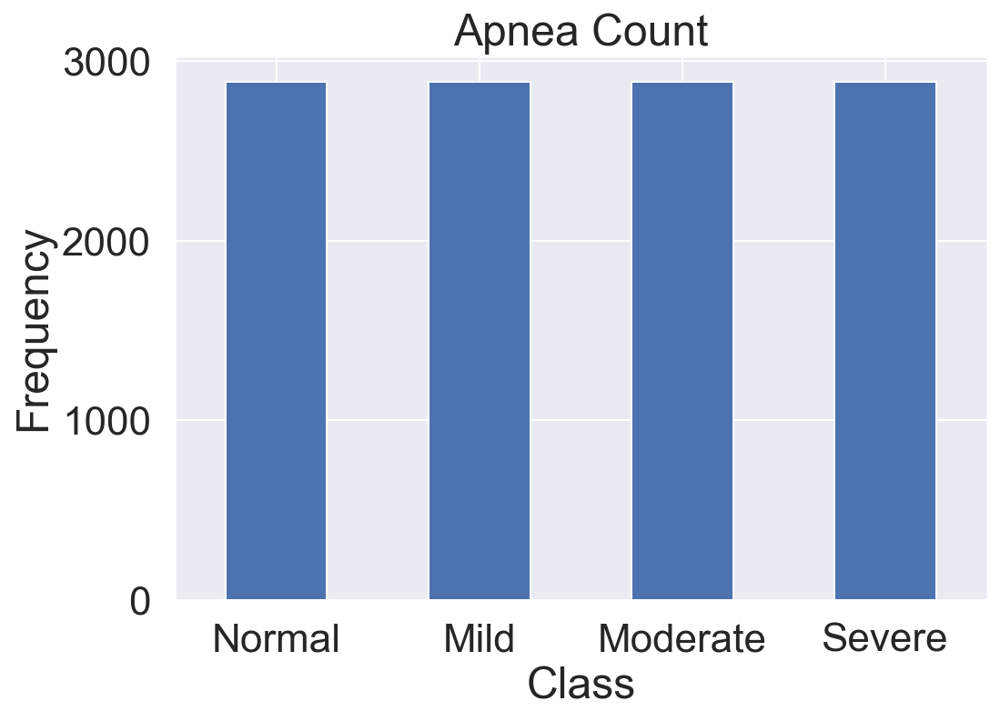

In [101]:
LABELS = ["Normal", "Mild","Moderate","Severe"]

count_classes = pd.value_counts(q, sort = True)

count_classes.plot(kind = 'bar', rot=0)

plt.title("Apnea Count")

plt.xticks(range(4), LABELS)

plt.xlabel("Class")

plt.ylabel("Frequency")

0    2884
3    2884
2    2884
1    2884
Name: status, dtype: int64


<function matplotlib.pyplot.show(close=None, block=None)>

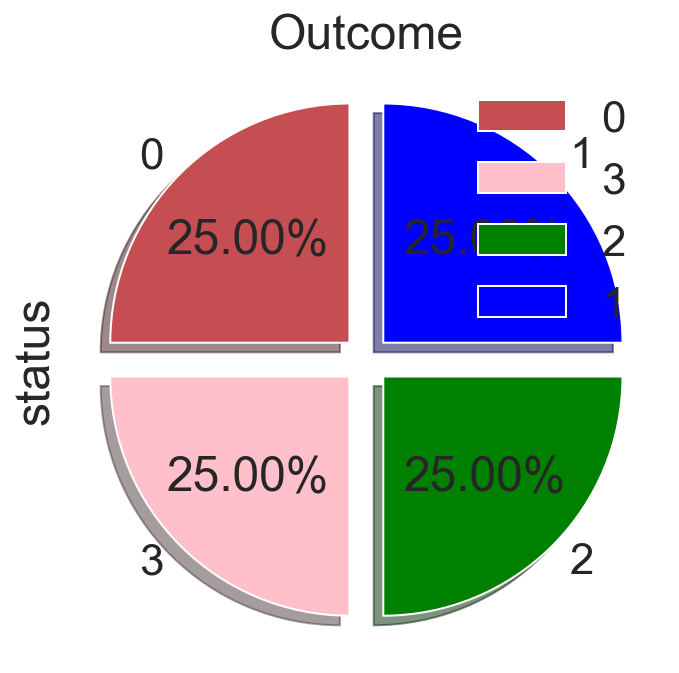

In [102]:
print(q.value_counts())
color=['r',"pink","green","blue"]
q.value_counts().plot.pie(colors=color,startangle=90, shadow=True,explode=(0.1, 0.1, 0.1, 0.1), autopct='%1.2f%%').set_title('Outcome')
plt.legend()
plt.show

In [103]:
a=(q.value_counts()[0] / q.count())*100
a=a.round(3)
print(a)
b=(q.value_counts()[1] / q.count())*100
b=b.round(3)
print(b)
c=(q.value_counts()[2] / q.count())*100
c=c.round(3)
print(c)
d=(q.value_counts()[3] / q.count())*100
d=d.round(3)
print(d)

25.0
25.0
25.0
25.0


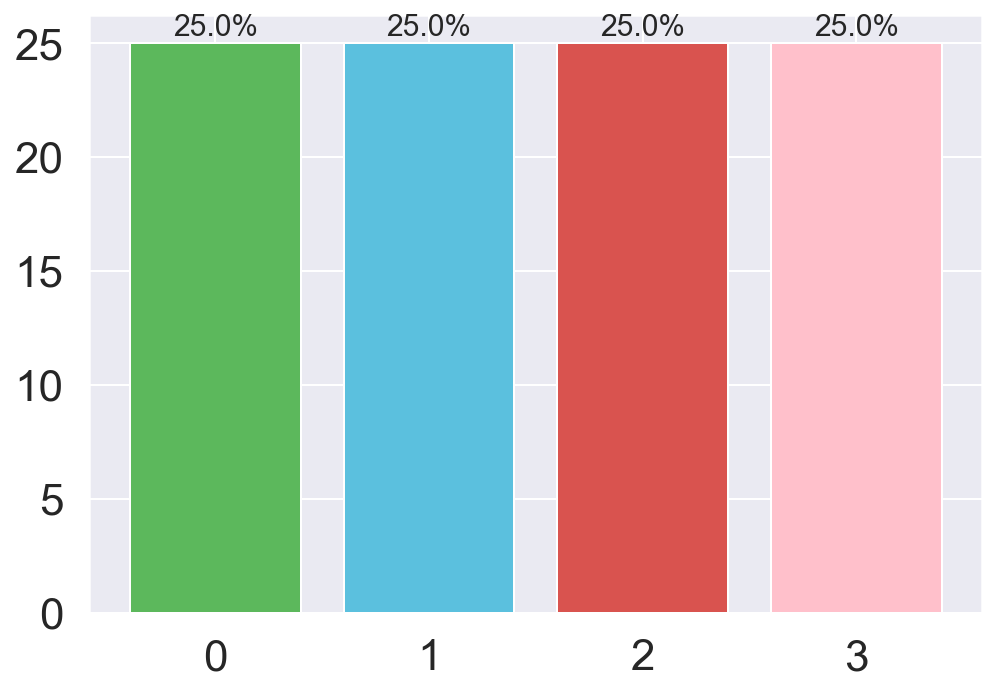

In [104]:
LABELS = ["Normal", "Mild","Moderate","Severe"]
frequencies = (a,b,c,d)

plt.figure()
colors=['#5cb85c','#5bc0de','#d9534f','pink']
p1 = plt.bar(np.arange(len(frequencies)), frequencies,color=colors)

for rect1 in p1:
    height = rect1.get_height()
    plt.annotate( "{}%".format(height),(rect1.get_x() + rect1.get_width()/2, height+.05),ha="center",va="bottom",fontsize=15)

plt.show()


In [105]:
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(p,q)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(p.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(12,'Score'))  #print 10 best features

      Specs        Score
3    Weight  7217.988323
7     Waist  4871.093200
9       Age  3404.715666
2       BMI  1755.915016
1       ESS  1177.822034
8   Buttock  1134.838033
6      Neck  1094.121940
0        BQ   651.950585
10        M   428.226684
4    Height   289.223123
5      Head    61.793620


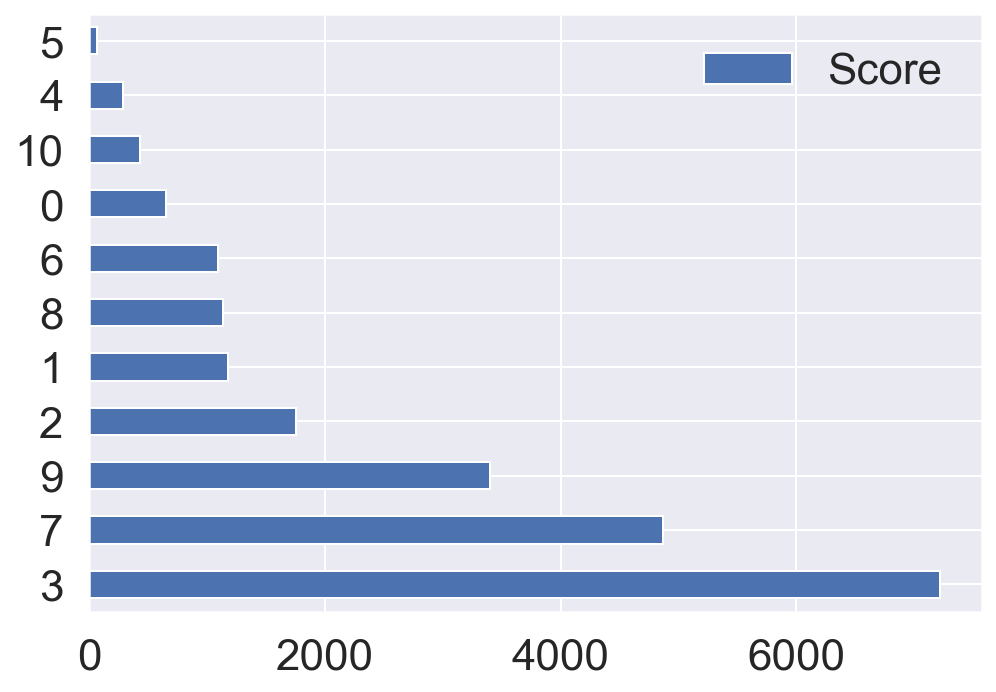

In [106]:
featureScores.nlargest(12,'Score').plot(kind='barh')
plt.show()

[0.02902781 0.0928501  0.09227773 0.09661433 0.09745372 0.09480642
 0.09689443 0.12920315 0.08839913 0.13652804 0.04594515]


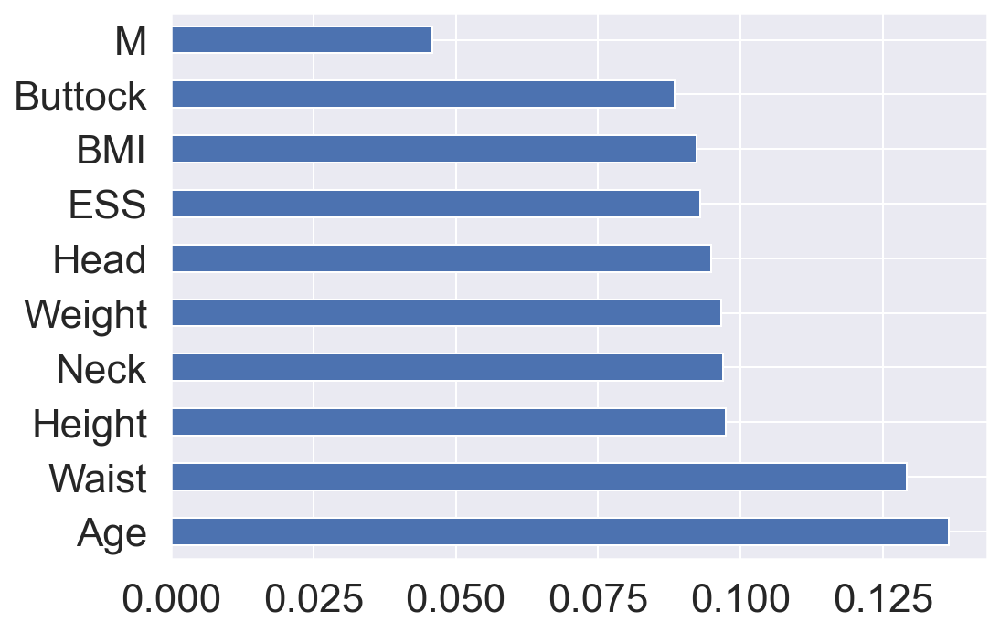

In [107]:
model = ExtraTreesClassifier()
model.fit(p,q)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [108]:
q.shape

(11536,)

In [109]:
p

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1
...,...,...,...,...,...,...,...,...,...,...,...
11531,0,2,30.288202,70.752620,152.849476,56.000000,37.602096,98.322642,105.000000,45.548428,0
11532,0,13,30.035205,96.623574,179.376426,51.933081,42.688213,104.467681,110.285171,45.935362,1
11533,0,10,25.762914,75.000000,170.623326,56.678013,37.327343,91.746652,100.876674,35.000000,1
11534,0,14,31.092042,87.754179,168.000000,60.655728,42.000000,114.655728,106.344272,70.688545,1


In [110]:
q

0        0
1        0
2        0
3        0
4        0
        ..
11531    3
11532    3
11533    3
11534    3
11535    3
Name: status, Length: 11536, dtype: int64

In [111]:
df2 = pd.concat([p,q],axis='columns')
df2.head()

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.0,174.0,57.5,39.0,95.5,106.5,20.0,1,0
1,0,8,26.989619,78.0,170.0,57.0,36.5,90.0,100.0,20.0,1,0
2,0,16,23.939481,75.0,177.0,59.0,39.0,88.0,104.0,20.0,1,0
3,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0
4,0,15,22.129740,67.0,174.0,57.0,35.0,74.0,94.0,20.0,1,0


In [112]:
df2.shape

(11536, 12)

In [113]:
df2 

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1,0
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1,0
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1,0
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
11531,0,2,30.288202,70.752620,152.849476,56.000000,37.602096,98.322642,105.000000,45.548428,0,3
11532,0,13,30.035205,96.623574,179.376426,51.933081,42.688213,104.467681,110.285171,45.935362,1,3
11533,0,10,25.762914,75.000000,170.623326,56.678013,37.327343,91.746652,100.876674,35.000000,1,3
11534,0,14,31.092042,87.754179,168.000000,60.655728,42.000000,114.655728,106.344272,70.688545,1,3


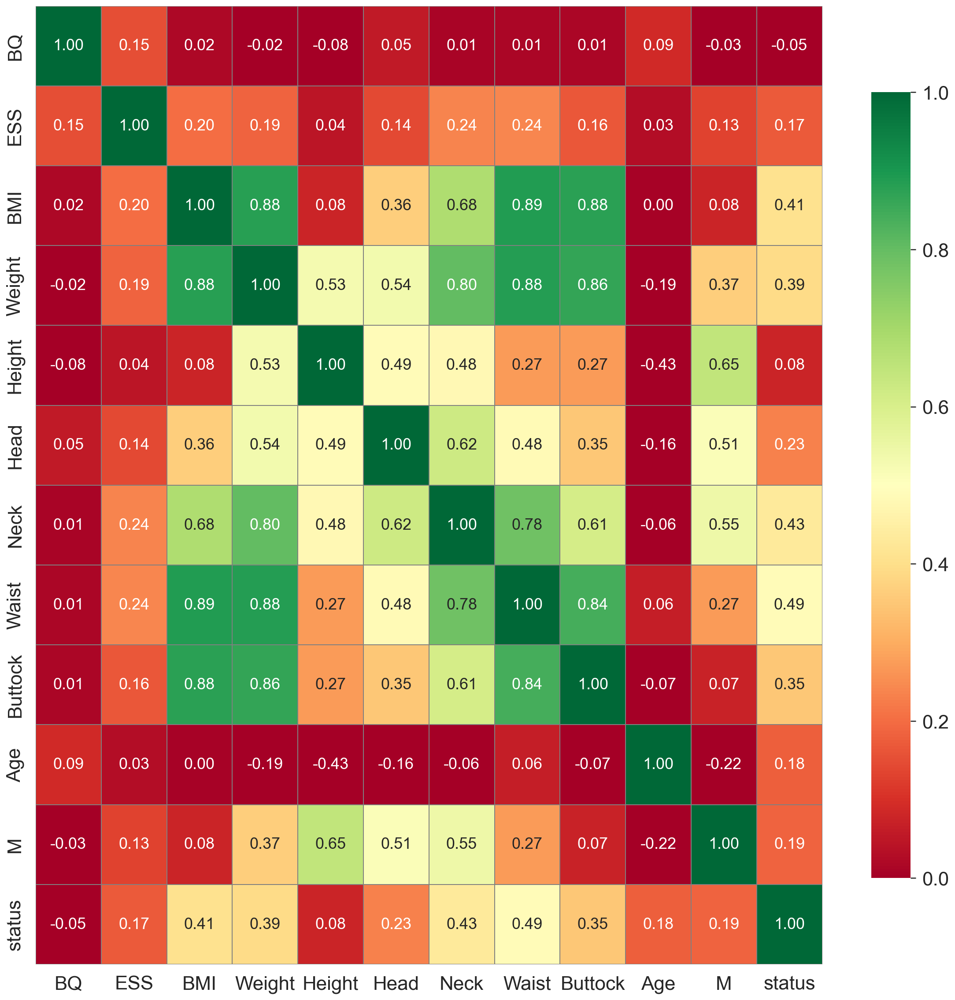

In [115]:
corrmat = df2.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
sns.set(font_scale=2)
#plot heat map
g=sns.heatmap(df2[top_corr_features].corr(),annot=True,cmap="RdYlGn" ,vmin=0.0, vmax=1.0, 
                  annot_kws={"size": 18},
                  fmt='.2f', cbar_kws={"shrink": .82},
                  linewidths=0.1, linecolor='gray')

In [406]:
df2.to_csv('D:\MAJOR PROJECT\datasets\sampled1_dataset.csv')

In [420]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(p, q, test_size=.2)
print('X_train', X_train.shape)
print('y_train', y_train.shape)
print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (9228, 11)
y_train (9228,)
X_test (2308, 11)
y_test (2308,)


In [421]:
def evaluate(model, X_test , y_test,modelname):
  y_pred1=model.predict(X_test)
  #precision    = precision_score(y_test, y_pred1)
 # recall       = recall_score(y_test, y_pred1)
 # f1score      = f1_score(y_test, y_pred1) 
 # rocauc       = roc_auc_score(y_test, y_pred1)
  #logloss      = log_loss(y_test, y_pred1)
  accuracy     = accuracy_score(y_test, y_pred1)
  classification=classification_report(y_test, y_pred1)
  confusion    = confusion_matrix(y_test, y_pred1)
  df_model = pd.DataFrame({  'model'        : [modelname],
                             'accuracy'     : [accuracy],
                           'classification':[classification],
                             #'precision'    : [precision],
                             #'recall'       : [recall],
                             #'f1score'      : [f1score],
                             #'rocauc'       : [rocauc],
                            # 'logloss'      : [logloss],
                             'timetaken'    : [time2],
                            'confusionmatrix' : [confusion]
                            
                                }) 
  return df_model

In [422]:
%%time
time2=time.time()
print("base model")
base_model = RandomForestClassifier(random_state=0)
base_model.fit(X_train, y_train)
#base_accuracy = evaluate(base_model, X_test, y_test,modelname)
model11 = evaluate(base_model,  X_test,  y_test, 'RandomForest')
model11.timetaken[0] = time.time() - time2
print("Random Forest")
print(base_model.get_params())
print(model1)



base model
Random Forest
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
          model  accuracy                                     classification  \
0  RandomForest  0.887787                precision    recall  f1-score   ...   

   timetaken                                    confusionmatrix  
0   0.996747  [[509, 1, 2, 89], [0, 425, 1, 0], [0, 0, 423, ...  
Wall time: 1.18 s


In [423]:
%%time
from sklearn.ensemble import ExtraTreesClassifier

time2=time.time()
print("base model")
base_model12 = ExtraTreesClassifier(random_state=0)
base_model12.fit(X_train, y_train)
model12 = evaluate(base_model12,  X_test,  y_test, 'Extra Tree')
model12.timetaken[0] = time.time() - time2
print("Extra Tree")
print(base_model12.get_params())

base model
Extra Tree
{'bootstrap': False, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
Wall time: 554 ms


In [424]:
%%time
time2=time.time()
print("base model")
base_model13 = LogisticRegression(random_state=0)
base_model13.fit(X_train, y_train)
model13 = evaluate(base_model13,  X_test,  y_test, 'Logistic Regression')
model13.timetaken[0] = time.time() - time2
print("Logoistic Regression")
print(base_model13.get_params())

base model
Logoistic Regression
{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': 0, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Wall time: 427 ms


In [425]:
%%time
time2=time.time()
print("base model")
base_model14 = KNeighborsClassifier()
base_model14.fit(X_train, y_train)
model14 = evaluate(base_model14,  X_test,  y_test, 'KNN')
model14.timetaken[0] = time.time() - time2
print("KNN")
print(base_model14.get_params())

base model
KNN
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
Wall time: 95.4 ms


In [426]:
%%time
time2=time.time()
print("base model")
base_model15 = LinearSVC(random_state=0)
base_model15.fit(X_train, y_train)
model15 = evaluate(base_model15,  X_test,  y_test, 'LinearSVC')
model15.timetaken[0] = time.time() - time2
print("LinearSVC")
print(base_model15.get_params())

base model
LinearSVC
{'C': 1.0, 'class_weight': None, 'dual': True, 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': 0, 'tol': 0.0001, 'verbose': 0}
Wall time: 1.36 s


In [427]:
%%time
time2=time.time()
print("base model")
base_model16 = GaussianNB()
base_model16.fit(X_train, y_train)
model16 = evaluate(base_model16,  X_test,  y_test, 'GaussianNB')
model16.timetaken[0] = time.time() - time2
print("GaussianNB")
print(base_model16.get_params())

base model
GaussianNB
{'priors': None, 'var_smoothing': 1e-09}
Wall time: 29.6 ms


In [428]:
%%time
time2=time.time()
print("base model")
base_model17=SVC(random_state=0)
base_model17.fit(X_train, y_train)
model17 = evaluate(base_model17,  X_test,  y_test, 'SVC')
model17.timetaken[0] = time.time() - time2
print("SVC")
print(base_model17.get_params())

base model
SVC
{'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': 0, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Wall time: 3.89 s


In [432]:
%%time
time2=time.time()
print("base model")
base_model18=DecisionTreeClassifier(random_state=0)
base_model18.fit(X_train, y_train)
model18 = evaluate(base_model18,  X_test,  y_test, 'Decision Tree')
model18.timetaken[0] = time.time() - time2
print("Decision Tree")
print(base_model18.get_params())


base model
Decision Tree
{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 0, 'splitter': 'best'}
Wall time: 77.6 ms


In [433]:
df_base1= pd.concat([model11,model12,model13,model14,model15,model16,model17,model18],axis = 0).reset_index()
df_base1.drop('index', axis=1, inplace=True)
df_base1

,model,accuracy,classification,timetaken,confusionmatrix
0,RandomForest,0.911179,precision recall f1-score ...,1.161457,"[[462, 3, 2, 102], [0, 578, 2, 0], [0, 0, 580,..."
1,Extra Tree,0.909879,precision recall f1-score ...,0.554376,"[[453, 1, 4, 111], [0, 580, 0, 0], [0, 0, 581,..."
2,Logistic Regression,0.525997,precision recall f1-score ...,0.426998,"[[136, 177, 133, 123], [103, 305, 120, 52], [6..."
3,KNN,0.840555,precision recall f1-score ...,0.095356,"[[323, 63, 42, 141], [0, 580, 0, 0], [0, 0, 58..."
4,LinearSVC,0.422010,precision recall f1-score ...,1.361803,"[[434, 35, 83, 17], [404, 83, 93, 0], [372, 1,..."
5,GaussianNB,0.568458,precision recall f1-score ...,0.021641,"[[190, 204, 86, 89], [56, 469, 48, 7], [78, 20..."
6,SVC,0.555893,precision recall f1-score ...,3.887536,"[[142, 183, 138, 106], [28, 369, 138, 45], [23..."
7,Decision Tree,0.869151,precision recall f1-score ...,0.077591,"[[415, 17, 17, 120], [5, 573, 1, 1], [2, 2, 57..."


In [435]:
classifiers=[
DecisionTreeClassifier(random_state=0),
SVC(random_state=0),
GaussianNB(),
KNeighborsClassifier(),
LogisticRegression(random_state=0),
RandomForestClassifier(random_state=0),
ExtraTreesClassifier(random_state=0)]

In [436]:
classes =  ["Normal", "Mild","Moderate","Severe"]
classes

['Normal', 'Mild', 'Moderate', 'Severe']

In [437]:
#Write function for class-centric metrics
# Classification report
def CR_viz():
    def Class_report(model,classes):
        visualizer = ClassificationReport(model, classes=classes, support=True)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data
        return visualizer.poof()
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        Class_report(name,classes)

#Class Prediction Error
def CPE_viz():    
    def CPE(model,classes):
        visualizer = ClassPredictionError(model, classes=classes)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CPE(name,classes)
        
#Confusion matrix
def CM_viz():    
    def CM(model,classes):
        visualizer = ConfusionMatrix(model, classes=classes,percent=True)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        CM(name,classes)
        
#ROC-AUC
def ROC_viz():    
    def ROC(model,classes):
        visualizer = ROCAUC(model, classes=classes)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        ROC(name,classes)

#Precision Recall Curve
def PRC_viz():  
    def PRC(model,classes):
        visualizer = PrecisionRecallCurve(model,classes=classes, per_class=True, iso_f1_curves=False,
    fill_area=False, micro=False)
        visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
        visualizer.score(X_test, y_test)  # Evaluate the model on the test data 
        return visualizer.poof()  
    for name in classifiers:
        ax = plt.subplot(1,1,1)
        PRC(name,classes)


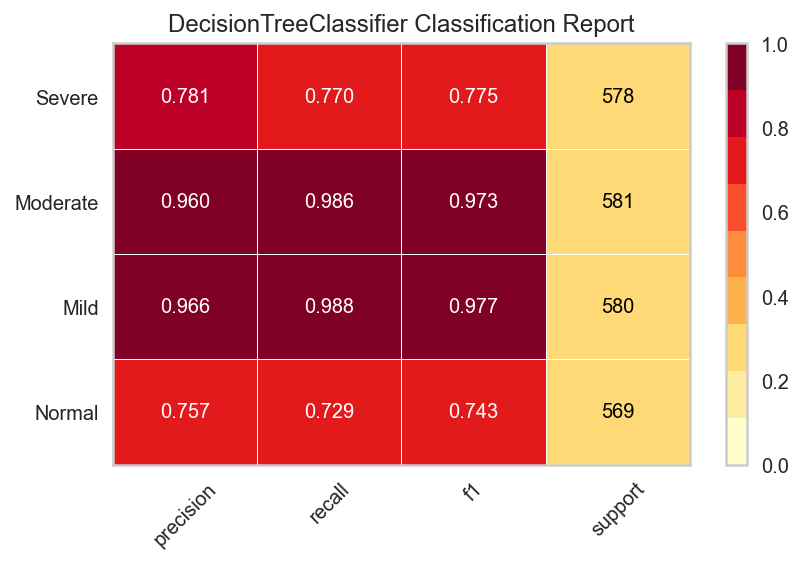

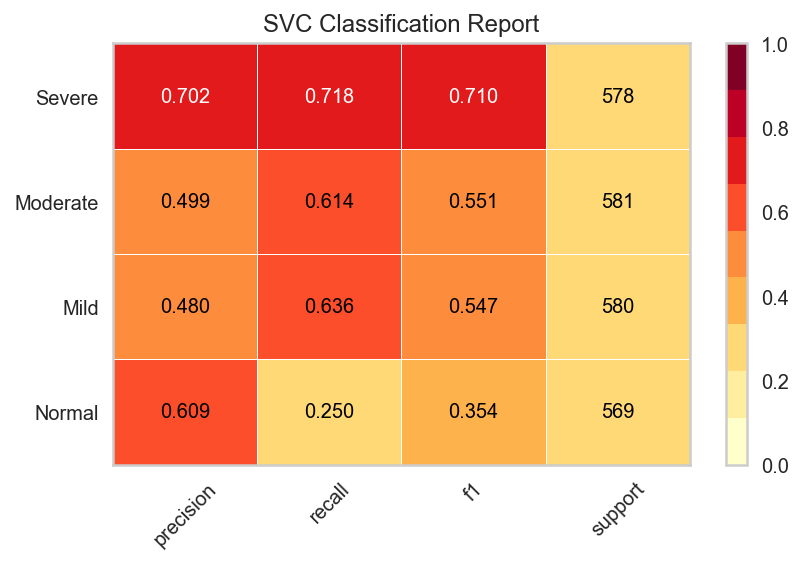

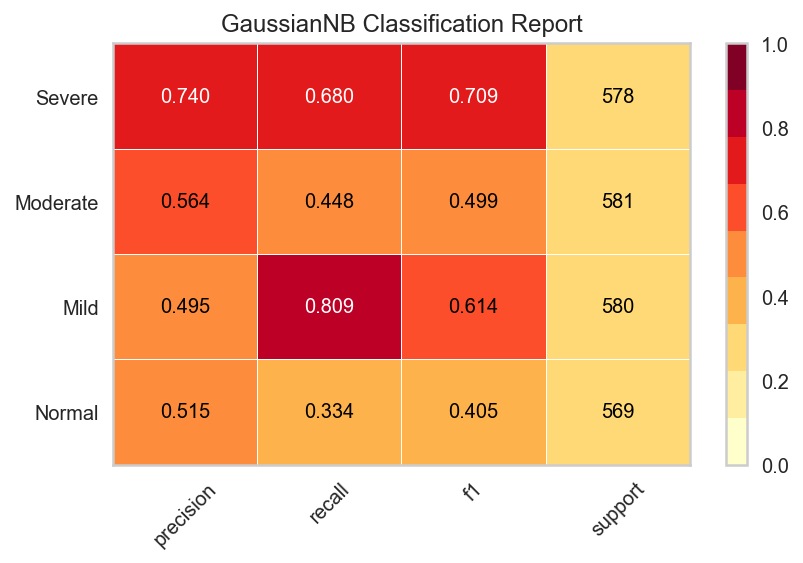

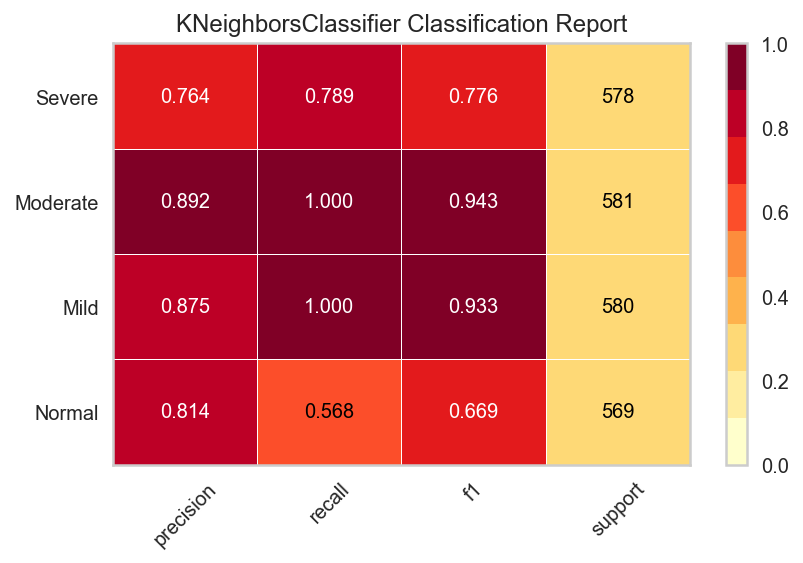

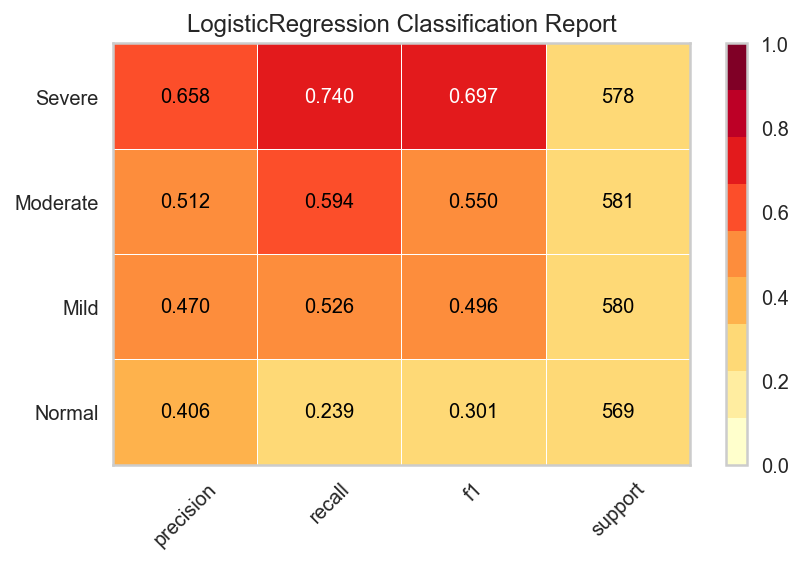

...

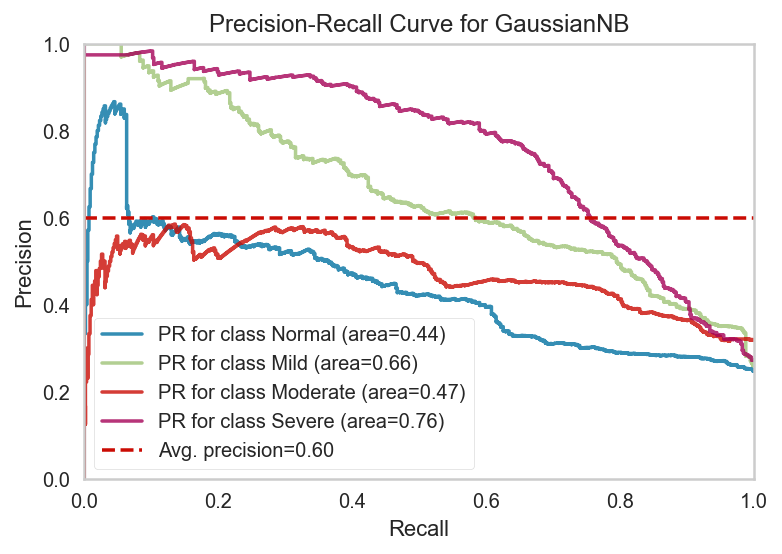

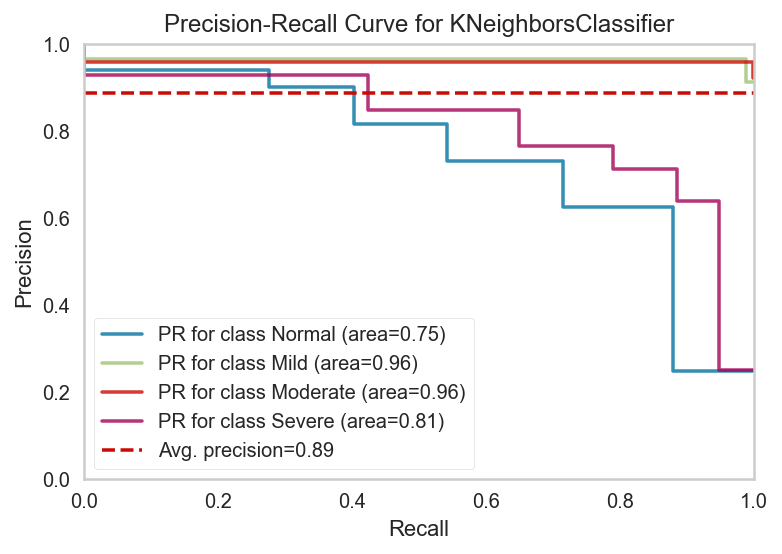

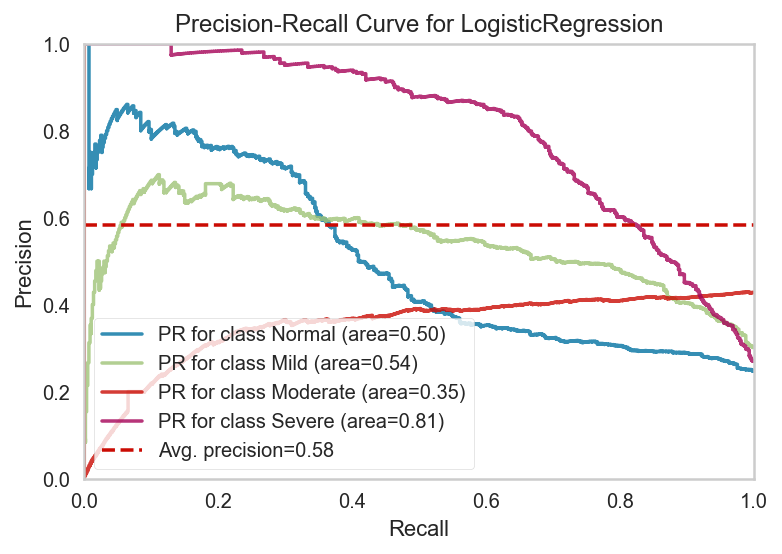

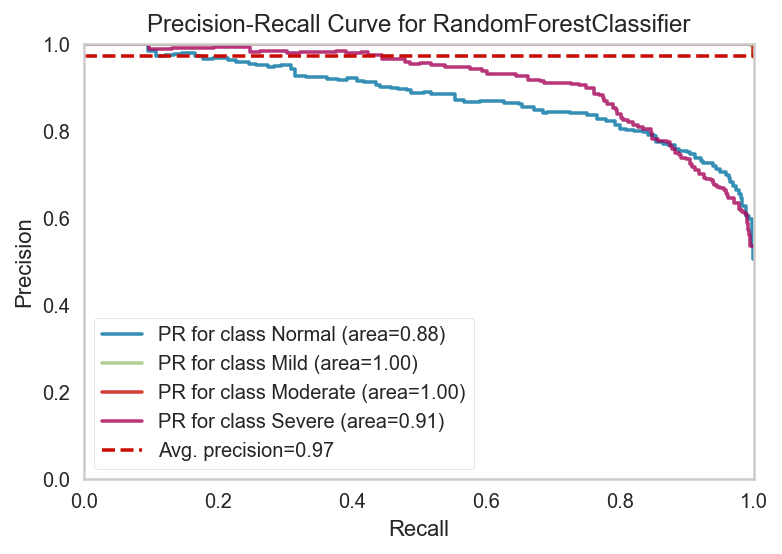

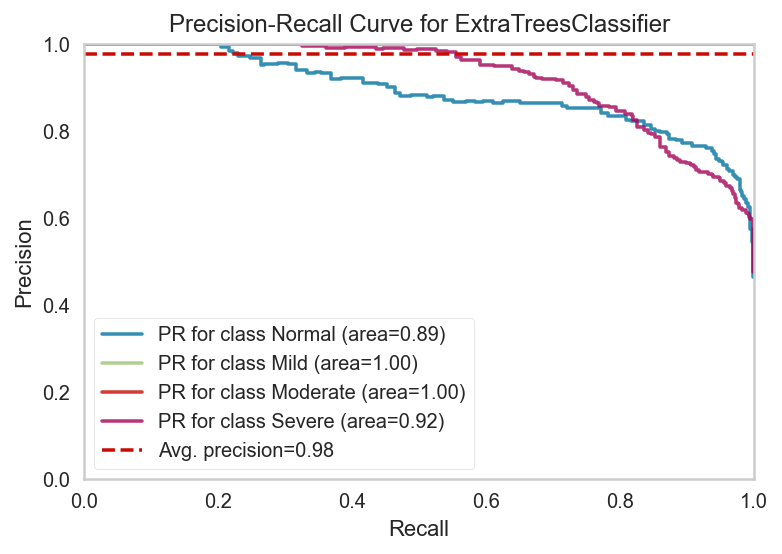

In [438]:
#deploy visualization
visualization =[CR_viz(),CPE_viz(),CM_viz(),ROC_viz(),PRC_viz()]

In [439]:
#Deploy aggregate metrics  
classifier_metrics()

DecisionTreeClassifier(random_state=0)
cohen_kappa_score: 0.826
log_loss: 4.519
zero_one_loss: 0.131
hemming_loss: 0.131
matthews_corrcoef: 0.826

------------------------------------------------------
SVC(random_state=0)
cohen_kappa_score: 0.407
log_loss: 0.000
zero_one_loss: 0.444
hemming_loss: 0.444
matthews_corrcoef: 0.416

------------------------------------------------------
GaussianNB()
cohen_kappa_score: 0.424
log_loss: 1.514
zero_one_loss: 0.432
hemming_loss: 0.432
matthews_corrcoef: 0.435

------------------------------------------------------
KNeighborsClassifier()
cohen_kappa_score: 0.787
log_loss: 1.689
zero_one_loss: 0.159
hemming_loss: 0.159
matthews_corrcoef: 0.791

------------------------------------------------------
LogisticRegression(random_state=0)
cohen_kappa_score: 0.368
log_loss: 1.080
zero_one_loss: 0.474
hemming_loss: 0.474
matthews_corrcoef: 0.371

------------------------------------------------------
RandomForestClassifier(random_state=0)
cohen_kappa_scor

In [440]:
df_base1['confusionmatrix']
df_base1.to_csv('D:\MAJOR PROJECT\datasets\Balanced_data2_performance_metrics.csv')

In [441]:
d=pd.read_csv("D:\MAJOR PROJECT\datasets\sampled1_dataset.csv",index_col=[0])  
d

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1,0
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1,0
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1,0
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
11531,0,1,24.277037,71.750525,171.917541,55.416492,36.708246,84.041229,95.792804,63.416492,1,3
11532,0,0,25.802596,79.020451,175.000000,58.510225,39.010225,91.342842,104.255113,32.979549,1,3
11533,0,15,39.668989,106.149640,163.700721,57.848538,46.158754,123.074820,131.532853,52.850360,1,3
11534,0,5,31.121639,76.776459,157.117705,53.670623,37.000000,103.764591,116.447082,75.000000,0,3


In [431]:
x = d.drop("status", axis = 1)
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x = pd.DataFrame(sc.fit_transform(x))
y = d["status"]
print(x)

             0         1         2         3         4         5         6   \
0     -0.396615  0.883385  0.683746  1.027134  0.821725  0.666696  0.575025   
1     -0.396615 -0.290572  0.207053  0.326231  0.324570  0.408985 -0.116995   
2     -0.396615  1.274704 -0.493219  0.115961  1.194591  1.439829  0.575025   
3     -0.396615  1.079045 -0.908712 -0.444761  0.821725  0.408985 -0.532208   
4     -0.396615  1.079045 -0.908712 -0.444761  0.821725  0.408985 -0.532208   
...         ...       ...       ...       ...       ...       ...       ...   
11531 -0.396615  1.274704  0.607023  0.816863  0.573147  2.119119  0.763827   
11532 -0.396615  0.296407  0.695518  0.777989  0.360499 -0.008202  0.855089   
11533 -0.396615  1.666024 -0.051957  0.554945  1.227295 -0.092904  0.443889   
11534 -0.396615 -0.094913  1.620649  1.378244  0.014140  0.150063  1.474977   
11535 -0.396615  0.100747  3.348245  3.779775  1.183325  1.619423  1.875160   

             7         8         9         10  
0  

In [432]:
from keras.utils.np_utils import to_categorical
y_cate = to_categorical(y)
y_cate

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.]], dtype=float32)

In [433]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x.values, y_cate, test_size=0.2)

In [434]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(9228, 11)
(9228, 4)
(2308, 11)
(2308, 4)


In [435]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
from keras.models import Sequential
from keras.layers import Activation, Dense
from keras.layers import Dropout
from tensorflow.keras.optimizers import SGD, Adam

In [436]:
model = Sequential()
model.add(Dense(64, input_shape = (11,), activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(32, activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(16, activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(8, activation = "relu"))
#model.add(Dropout(0.5))
model.add(Dense(4, activation = "softmax"))
#model.add(Dense(2, activation = "softmax"))
model.compile(Adam(lr = 0.01), "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_7 (Dense)             (None, 64)                768       
                                                                 
 dense_8 (Dense)             (None, 32)                2080      
                                                                 
 dense_9 (Dense)             (None, 16)                528       
                                                                 
 dense_10 (Dense)            (None, 8)                 136       
                                                                 
 dense_11 (Dense)            (None, 4)                 36        
                                                                 
Total params: 3,548
Trainable params: 3,548
Non-trainable params: 0
_________________________________________________________________


In [437]:
model.fit(x_train, y_train,epochs=20)

Epoch 1/20
289/289 [==============================] - 1s 2ms/step - loss: 0.7163 - accuracy: 0.6960
Epoch 2/20
289/289 [==============================] - 0s 2ms/step - loss: 0.4207 - accuracy: 0.8230
Epoch 3/20
289/289 [==============================] - 0s 1ms/step - loss: 0.3645 - accuracy: 0.8444
Epoch 4/20
289/289 [==============================] - 0s 2ms/step - loss: 0.3384 - accuracy: 0.8527
Epoch 5/20
289/289 [==============================] - 0s 2ms/step - loss: 0.3085 - accuracy: 0.8636
Epoch 6/20
289/289 [==============================] - 0s 1ms/step - loss: 0.2920 - accuracy: 0.8713
Epoch 7/20
289/289 [==============================] - 0s 1ms/step - loss: 0.3119 - accuracy: 0.8641
Epoch 8/20
289/289 [==============================] - 0s 1ms/step - loss: 0.2803 - accuracy: 0.8758
Epoch 9/20
289/289 [==============================] - 0s 1ms/step - loss: 0.2747 - accuracy: 0.8777
Epoch 10/20
289/289 [==============================] - 0s 1ms/step - loss: 0.2686 - accuracy: 0.8801

In [438]:
model.evaluate(x_test,y_test)

73/73 [==============================] - 0s 1ms/step - loss: 0.2833 - accuracy: 0.8709


[0.28334665298461914, 0.8708838820457458]

In [439]:
predictions = model.predict(x_test, steps=len(x_test), verbose=0)

In [440]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([0, 2, 1, 1, 0, 3, 2, 2, 0, 1], dtype=int64)

In [441]:
y_true=np.argmax(y_test, axis=-1)
y_true[:10]

array([0, 2, 1, 1, 0, 0, 2, 2, 0, 1], dtype=int64)

In [442]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[469,  20,   8,  75],
       [  0, 565,   0,   0],
       [  1,   0, 594,   0],
       [184,   5,   5, 382]], dtype=int64)

In [443]:
TP = 451
TN = 5+562+0+0+0+578+152+3
FP = 9+3+115
FN=0+0+430
print('Accuracy for 0 :', (TP+TN)/(TP+TN+FP+FN))



Accuracy for 0 : 0.7586655112651647


In [444]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(y_true, y_pred)))


Accuracy: 0.87



In [445]:
print('Micro Precision: {:.2f}'.format(precision_score(y_true, y_pred, average='micro')))
print('Micro Recall: {:.2f}'.format(recall_score(y_true, y_pred, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(f1_score(y_true, y_pred, average='micro')))

Micro Precision: 0.87
Micro Recall: 0.87
Micro F1-score: 0.87



In [446]:
print('Macro Precision: {:.2f}'.format(precision_score(y_true, y_pred, average='macro')))
print('Macro Recall: {:.2f}'.format(recall_score(y_true, y_pred, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(f1_score(y_true, y_pred, average='macro')))

Macro Precision: 0.87
Macro Recall: 0.87
Macro F1-score: 0.87



In [447]:
print('Weighted Precision: {:.2f}'.format(precision_score(y_true, y_pred, average='weighted')))
print('Weighted Recall: {:.2f}'.format(recall_score(y_true, y_pred, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(f1_score(y_true, y_pred, average='weighted')))

Weighted Precision: 0.87
Weighted Recall: 0.87
Weighted F1-score: 0.87


In [448]:
from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_true, y_pred, target_names=['Class 0','Class 1', 'Class 2', 'Class 3']))


Classification Report

              precision    recall  f1-score   support

     Class 0       0.72      0.82      0.77       572
     Class 1       0.96      1.00      0.98       565
     Class 2       0.98      1.00      0.99       595
     Class 3       0.84      0.66      0.74       576

    accuracy                           0.87      2308
   macro avg       0.87      0.87      0.87      2308
weighted avg       0.87      0.87      0.87      2308



Text(70.0, 0.5, 'Truth')

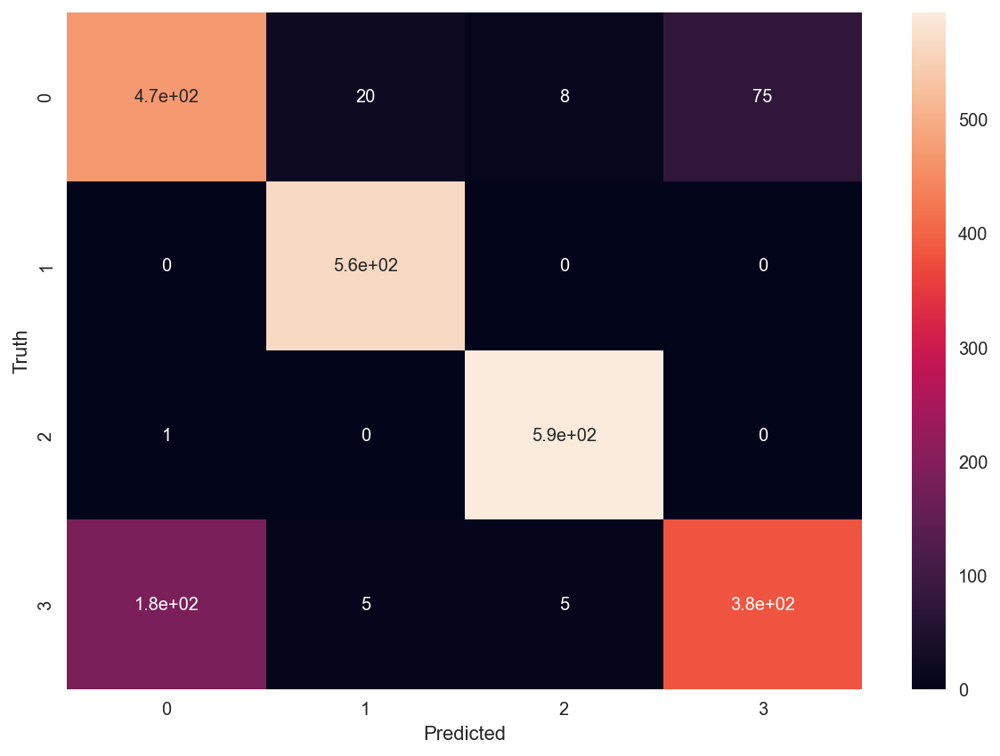

In [449]:
import seaborn as sn
plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [450]:
df.shape
d=pd.read_csv("D:\MAJOR PROJECT\datasets\sampled1_dataset.csv",index_col=[0])  
d

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M,status
0,0,14,29.065927,88.000000,174.000000,57.500000,39.000000,95.500000,106.500000,20.000000,1,0
1,0,8,26.989619,78.000000,170.000000,57.000000,36.500000,90.000000,100.000000,20.000000,1,0
2,0,16,23.939481,75.000000,177.000000,59.000000,39.000000,88.000000,104.000000,20.000000,1,0
3,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
4,0,15,22.129740,67.000000,174.000000,57.000000,35.000000,74.000000,94.000000,20.000000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
11531,0,16,28.731747,85.000000,172.000000,60.317931,39.682069,102.092414,104.092414,62.456552,1,3
11532,0,11,29.117203,84.445374,170.289075,56.190590,40.011762,99.635965,105.855463,66.156299,1,3
11533,0,18,25.861463,81.263128,177.263128,56.026255,38.526255,97.210330,101.920947,51.947489,1,3
11534,0,9,33.146745,93.009400,167.502350,56.497650,42.251175,108.748825,113.751175,39.009400,1,3


In [451]:
X = d.drop("status", axis = 1)
y=d.status


In [452]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=25)

In [453]:
X_train_scaled = X_train.copy()
X_train_scaled['ESS'] = X_train_scaled['ESS'] / 100

X_test_scaled = X_test.copy()
X_test_scaled['ESS'] = X_test_scaled['ESS'] / 100


In [454]:
X_train_scaled = X_train_scaled.copy()
X_train_scaled['BMI'] = X_train_scaled['BMI'] / 100

X_test_scaled = X_test_scaled.copy()
X_test_scaled['BMI'] = X_test_scaled['BMI'] / 100


In [455]:
X_train_scaled = X_train_scaled.copy()
X_train_scaled['Weight'] = X_train_scaled['Weight'] / 100

X_test_scaled = X_test_scaled.copy()
X_test_scaled['Weight'] = X_test_scaled['Weight'] / 100


In [456]:
X_train_scaled = X_train_scaled.copy()
X_train_scaled['Height'] = X_train_scaled['Height'] / 100

X_test_scaled = X_test_scaled.copy()
X_test_scaled['Height'] = X_test_scaled['Height'] / 100


In [457]:
X_train_scaled = X_train_scaled.copy()
X_train_scaled['Head'] = X_train_scaled['Head'] / 100

X_test_scaled = X_test_scaled.copy()
X_test_scaled['Head'] = X_test_scaled['Head'] / 100


In [458]:
X_train_scaled = X_train_scaled.copy()
X_train_scaled['Neck'] = X_train_scaled['Neck'] / 100

X_test_scaled = X_test_scaled.copy()
X_test_scaled['Neck'] = X_test_scaled['Neck'] / 100


In [459]:
X_train_scaled = X_train_scaled.copy()
X_train_scaled['Waist'] = X_train_scaled['Waist'] / 100

X_test_scaled = X_test_scaled.copy()
X_test_scaled['Waist'] = X_test_scaled['Waist'] / 100


In [460]:
X_train_scaled = X_train_scaled.copy()
X_train_scaled['Buttock'] = X_train_scaled['Buttock'] / 100

X_test_scaled = X_test_scaled.copy()
X_test_scaled['Buttock'] = X_test_scaled['Buttock'] / 100


In [461]:
X_train_scaled = X_train_scaled.copy()
X_train_scaled['Age'] = X_train_scaled['Age'] / 100

X_test_scaled = X_test_scaled.copy()
X_test_scaled['Age'] = X_test_scaled['Age'] / 100


In [462]:
X_train_scaled

,BQ,ESS,BMI,Weight,Height,Head,Neck,Waist,Buttock,Age,M
712,0,0.09,0.235479,0.780000,1.820000,0.580000,0.365000,0.835000,1.005000,0.330000,1
11526,0,0.07,0.267756,0.800000,1.728533,0.560933,0.370733,0.942800,1.042933,0.334400,1
9669,0,0.09,0.287948,0.765697,1.630717,0.542151,0.322868,0.937092,1.138526,0.604263,0
8784,0,0.08,0.234766,0.739582,1.775692,0.581527,0.366527,0.887846,1.007846,0.403055,1
1962,0,0.04,0.409995,1.270000,1.760000,0.565000,0.442000,1.300000,1.290000,0.440000,1
...,...,...,...,...,...,...,...,...,...,...,...
8447,0,0.12,0.240181,0.643836,1.636918,0.561153,0.373082,0.872317,0.957694,0.562351,1
2934,1,0.11,0.277743,0.880000,1.780000,0.575000,0.420000,1.050000,1.045000,0.540000,1
10383,1,0.14,0.281370,0.740000,1.621747,0.566486,0.375342,0.943938,1.016987,0.410960,0
6618,0,0.06,0.219625,0.552364,1.572512,0.552488,0.330379,0.777906,0.897118,0.597488,1


In [463]:
%time
units=1
model = keras.Sequential([
    keras.layers.Dense(units=units, input_shape=(11,), activation='sigmoid', kernel_initializer='glorot_uniform', bias_initializer='zeros')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train_scaled, y_train, epochs=10)

Wall time: 0 ns
Epoch 1/10
289/289 [==============================] - 1s 1ms/step - loss: -1.2468 - accuracy: 0.2529
Epoch 2/10
289/289 [==============================] - 0s 1ms/step - loss: -2.3877 - accuracy: 0.2529
Epoch 3/10
289/289 [==============================] - 0s 1ms/step - loss: -3.4527 - accuracy: 0.2529
Epoch 4/10
289/289 [==============================] - 0s 1ms/step - loss: -4.5319 - accuracy: 0.2529
Epoch 5/10
289/289 [==============================] - 0s 1ms/step - loss: -5.6231 - accuracy: 0.2529
Epoch 6/10
289/289 [==============================] - 0s 1ms/step - loss: -6.7196 - accuracy: 0.2529
Epoch 7/10
289/289 [==============================] - 0s 1ms/step - loss: -7.8238 - accuracy: 0.2529
Epoch 8/10
289/289 [==============================] - 0s 1ms/step - loss: -8.9369 - accuracy: 0.2529
Epoch 9/10
289/289 [==============================] - 0s 1ms/step - loss: -10.0488 - accuracy: 0.2529
Epoch 10/10
289/289 [==============================] - 0s 1ms/step - loss:

In [464]:
model.evaluate(X_test_scaled,y_test)

73/73 [==============================] - 0s 2ms/step - loss: -12.1986 - accuracy: 0.2383


[-12.1985502243042, 0.23830156028270721]

In [465]:
predictions = model.predict(X_test_scaled, steps=len(X_test_scaled), verbose=0)

In [466]:
y_pred = np.argmax(predictions, axis=-1)
y_pred[:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [467]:
y_test[:10]

4556     0
1373     0
555      3
6037     1
7533     1
3273     3
9131     2
3773     3
11392    3
1318     3
Name: status, dtype: int64

In [468]:
cm = confusion_matrix(y_test, y_pred)
cm

array([[579,   0,   0,   0],
       [550,   0,   0,   0],
       [593,   0,   0,   0],
       [586,   0,   0,   0]], dtype=int64)

In [469]:
%time
units=1
model = keras.Sequential([
    keras.layers.Dense(units=units, input_shape=(11,), activation='relu', kernel_initializer='glorot_uniform', bias_initializer='zeros')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train_scaled, y_train, epochs=10)

Wall time: 0 ns
Epoch 1/10
289/289 [==============================] - 1s 1ms/step - loss: -7.5572 - accuracy: 0.2528
Epoch 2/10
289/289 [==============================] - 0s 1ms/step - loss: -7.5933 - accuracy: 0.2529
Epoch 3/10
289/289 [==============================] - 0s 1ms/step - loss: -7.5867 - accuracy: 0.2528
Epoch 4/10
289/289 [==============================] - 0s 1ms/step - loss: -7.6205 - accuracy: 0.2529
Epoch 5/10
289/289 [==============================] - 0s 1ms/step - loss: -7.6234 - accuracy: 0.2528
Epoch 6/10
289/289 [==============================] - 0s 1ms/step - loss: -7.6144 - accuracy: 0.2528
Epoch 7/10
289/289 [==============================] - 0s 1ms/step - loss: -7.5991 - accuracy: 0.2529
Epoch 8/10
289/289 [==============================] - 0s 1ms/step - loss: -7.6058 - accuracy: 0.2529
Epoch 9/10
289/289 [==============================] - 0s 1ms/step - loss: -7.6054 - accuracy: 0.2529
Epoch 10/10
289/289 [==============================] - 0s 1ms/step - loss: 

In [470]:
model.evaluate(X_test_scaled,y_test)

73/73 [==============================] - 0s 1ms/step - loss: -7.6220 - accuracy: 0.2400


[-7.622004508972168, 0.24003465473651886]